# <span style="font-size:0.45em">High-Dimensional-Deep-Learning :<br></span> **Mini-Projet 1/3: Chats ou Chiens ?**

## Introduction & Installation

<a id="installation"></a>
Pour faire tourner ce notebook un environnement python avec certains packages spécifiques est nécessaire.
Vous trouverez dans `install` le fichier `install/environment.yml` qui permet de creer un environnement
fonctionnel pour ce notebook avec conda:

```bash
    # pour créer l'environement et installer les packages
    conda env create -f install/environment.yml --verbose

    # pour activer l'environement
    conda activate HDDL.1

    # pour rendre l'environement visible pour le notebook
    python -m ipykernel install --user --name HDDL.1 --display-name "HDDL.1"
```

Le jeu de données utilisé pour ce mini-projet est le Oxford-IIIT Pet Dataset, composé de photographies de chats et de chiens appartenant à 37 races différentes. Le jeu de données est disponible à l’adresse suivante :
[www.robots.ox.ac.uk/~vgg/data/pets](www.robots.ox.ac.uk/~vgg/data/pets).

Il peut être téléchargé en faisant tourner le script `downloader.py` avec la commande :

```bash
    python oxford-pets/downloader.py
```
dans un terminal depuis le dossier *root* du project (project-hddl). Vous pouvez aussi le télécharger manuellement depuis l’adresse :
[www.robots.ox.ac.uk/~vgg/data/pets](www.robots.ox.ac.uk/~vgg/data/pets)
et placer les images et annotations dans ``data/oxford-pets`.

La structure des dossiers/fichiers doit être:
```txt
.
├── + data/
│   └── + oxford-pets/
│       ├── images/ ...
│       └── annotations/ ...
│
├── install/ ...
├── oxford-pets/ ...
:
└── readme.md
```

#### Imports et fonctions utilitaires

In [1]:
### Imports Principaux

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
import torch.nn.functional as F

from torchvision.io import decode_image
from PIL import Image
from dataset import OxfordPetsDataset

import numpy as np
import pandas as pd

import marimo as mo
import matplotlib.pyplot as plt
import seaborn as sn

import albumentations as A
from albumentations.pytorch import ToTensorV2

from tqdm.auto import tqdm
from statistics import mean

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device == "cpu":
    print("warning ! the code will be run on the cpu.")

In [3]:
### Imports pour l'affichage

from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches

In [4]:
### Options d'affichage

# pandas
pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None)

# seaborn
sn.set_style("darkgrid")
sn.set_palette("colorblind")

## I. Analyse Exploratoire

Le jeu de données utilisé pour ce mini-projet est le `Oxford-IIIT Pet Dataset`, 
composé de photographies de chats et de chiens appartenant à 37 races différentes.

L'objectif de cette partie est d'effectuer une analyse exploratoire. 
Nous souhaitons comprendre la structure du jeu de données Oxford-IIIT Pet et 
évaluer la qualité de ses annotations (labels et masques de segmentation) 
avant de procéder à l'entraînement des modèles.

En particulier nous explorerons les questions suivantes posées par le sujet:
- Quelle est la répartition par espèce et par race dans le jeu de donnée.
- Les masques de segmentations associés aux images sont-ils bons/cohérents.
- Y-a t'il eventuellement des déséquilibres ou biais visuels.

#### I.1 Récupération du Dataset

Si une erreur survient lors de cette partie ou que le dataset est vide assurez-vous d'avoir téléchargé le dataset comme indiqué dans la partie [**Introduction**](#installation).

In [5]:
### Récupération du Dataset

data = OxfordPetsDataset(
    fetch_masks = True,
    dataset_root = "../data/oxford-pets"
)

print(f"""Le dataset \"data\" contient {len(data)} membres, avec:
- les images de chats/chiens
- leurs labels espèce/race 
- les masques de segmentation (animal, arrière-plan, bordure) associés
""")

Le dataset "data" contient 7390 membres, avec:
- les images de chats/chiens
- leurs labels espèce/race 
- les masques de segmentation (animal, arrière-plan, bordure) associés



In [6]:
### Récupération du DataFrame avec les informations sur le Dataset

dframe__ = data.get_dataframe()
dframe__.sample(5, random_state=53)

,identifier,animal,animal.id,race,race.id,imagefile,bboxfile,maskfile
1327,Maine_Coon_269,cat,0,maine_coon,20,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/images/Maine_Coon_269.jpg,<NA>,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/trimaps/Maine_Coon_269.png
3146,beagle_50,dog,1,beagle,4,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/images/beagle_50.jpg,<NA>,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/trimaps/beagle_50.png
1480,Persian_186,cat,0,persian,23,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/images/Persian_186.jpg,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/xmls/Persian_186.xml,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/trimaps/Persian_186.png
6855,staffordshire_bull_terrier_152,dog,1,staffordshire_bull_terrier,34,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/images/staffordshire_bull_terrier_152.jpg,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/xmls/staffordshire_bull_terrier_152.xml,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/trimaps/staffordshire_bull_terrier_152.png
3221,boxer_118,dog,1,boxer,8,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/images/boxer_118.jpg,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/xmls/boxer_118.xml,/home/gjoffre/Documents/project-hddl-segmentation/data/oxford-pets/annotations/trimaps/boxer_118.png


Toutes les images du Oxford-IIIT Pet Dataset ont un masque de segmentation associé, mais toutes n'ont pas un fichier décrivant une bounding box pour la tête de l'animal. C'est pourquoi la colonne "bboxfile" à des valeurs manquantes. Comme il s'agit d'un mini-projet portant sur la segmentation et non pas sur la detection d'objet nous allons ignorer la colonne et revenir à un dataset sans ces valeurs manquantes.

In [7]:
### On retire la colonne bboxfile qui est inutilisée

dframe = dframe__.drop(columns=["bboxfile"])
del dframe__

In [8]:
### UTILS: summary(df: DataFrame)

def summary(df: pd.DataFrame) -> pd.DataFrame:
    over_total = " / "+str(len(df))
    infos = pd.DataFrame(data={
        "dtype": df.dtypes,
        "na/total": df.isnull().sum().map(str) + over_total,
        "unique": df.nunique()
    })

    infos.index.names = ["column"]
    return infos

In [9]:
### Détails sur les colonnes du DataFrame

summary(dframe)

,dtype,na/total,unique
column,,,
identifier,str,0 / 7390,7390
animal,category,0 / 7390,2
animal.id,int8,0 / 7390,2
race,category,0 / 7390,37
race.id,int8,0 / 7390,37
imagefile,object,0 / 7390,7390
maskfile,object,0 / 7390,7390


#### I.2 Analyse de la répartition des images entre espèces et races

Le jeu de données comporte 7390 images avec un seul animal par image, il y a deux animaux possibles (chien ou chat) et 37 races distinctes. Analysons la répartition de ces images parmi ces catégories.

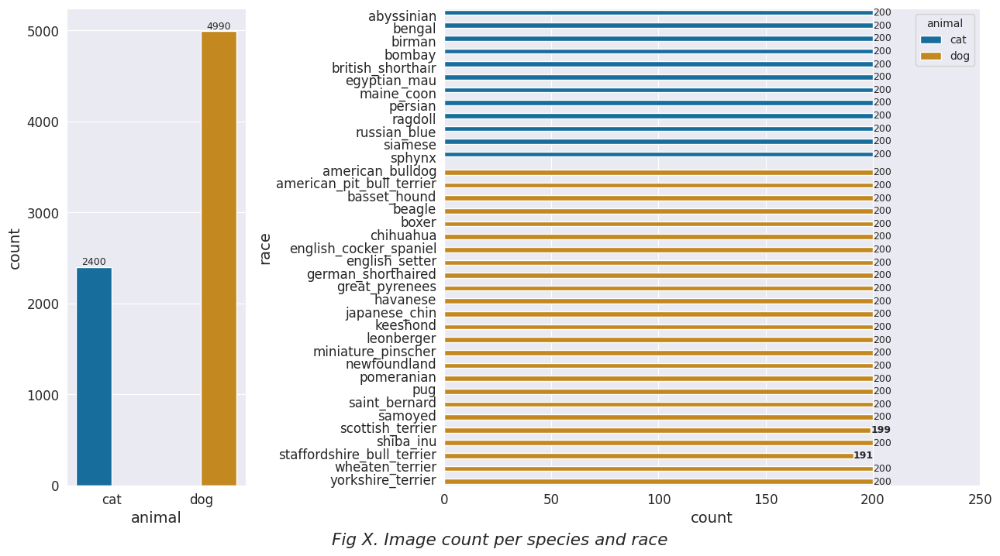

In [10]:
### Répartition Animal / Race

def plot_repartition(df):

    counts_race = df.groupby(["animal", "race"], observed=True)\
        .agg(count = pd.NamedAgg(column="identifier", aggfunc="count") )

    counts_animal = counts_race.groupby("animal", observed=True)\
        .agg(count = pd.NamedAgg(column="count", aggfunc="sum") )

    fig, (ax1, ax2) = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(13,7))

    ax1 = sn.barplot(counts_animal, y="count", x="animal", orient="x", hue="animal", ax=ax1)
    for i in range(2) :
        ax1.bar_label(ax1.containers[i], fontsize=9)

    ax1.set_xlabel(ax1.get_xlabel(), fontsize=14)
    ax1.set_ylabel(ax1.get_ylabel(), fontsize=14)
    ax1.tick_params(axis='x', labelsize=12)
    ax1.tick_params(axis='y', labelsize=12)

    per_genre_order = counts_race.index.get_level_values(1).values
    ax2 = sn.barplot(counts_race, y="race", x="count", orient="y", hue="animal", order=per_genre_order, ax=ax2)
    ax2.set(xlim=(0, 250))
    for i in range(2) :
        labels_ = ax2.bar_label(ax2.containers[i], fontsize=9)

        for txt in labels_:
            if txt.get_text() != "200":
                txt.set_weight("bold")

    ax2.set_xlabel(ax2.get_xlabel(), fontsize=14)
    ax2.set_ylabel(ax2.get_ylabel(), fontsize=14)
    ax2.tick_params(axis='x', labelsize=12)
    ax2.tick_params(axis='y', labelsize=12)

    fig.tight_layout()
    fig.supxlabel("Fig X. Image count per species and race", y=-0.02, size=15.5, style="italic")
    plt.show()

plot_repartition(dframe)

Il y a environ deux fois plus de chiens que de chats dans le jeu de données, avec 12 races de chats et 25 races de chiens. Nous remarquons les points suivants:
- Un déséquilibre des espèces: avec environ 2/3 de chiens pour 1/3 de chats présents dans le jeu de donnée.
- Un équilibre des races: Malgré le déséquilibre entre espèces, la répartition par race est très homogène. Chaque race dispose d'environ 200 images, ce qui nous donne une base d'apprentissage stable pour la classification fine.

#### I.3 Exploration de la cohérence des masques de segmentation

Les masques de segmentation du jeu de données contiennent 3 classes, encodées numériquement par des valeurs discrètes 1, 2 et 3 qui correspondent à :
1. l'animal (pet)
2. le fond (background)
3. une troisième classe de bordure ou d'incertitude (border)

In [11]:
### UTILS: plot_masks(sr: pd.Series)

def plot_masks(
    idx: list[int],
    caption: str = "Images along with their segmentation mask",
    max_images: int = 15
):

    N_IMAGES = min(len(idx), max_images)
    N_COLS = N_IMAGES if N_IMAGES < 5 else 5
    N_ROWS = 0 if N_IMAGES == 0 else (N_IMAGES - 1) // N_COLS + 1
    FOOTER_SIZE = 0.015

    colors = ["violet", "black", "grey", "white"]    # 0 is unused but matplotlib needs it
    cmap = ListedColormap(colors)                    # Define colors for levels 0, 1, 2, 3
    norm = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], cmap.N) # set boundaries at half-steps

    patches = [
        mpatches.Patch(color="black", label="1: pet"),
        mpatches.Patch(color="grey",  label="2: background"),
        mpatches.Patch(facecolor="white", label="3: border", edgecolor='black', linewidth=1.0),
    ]

    fig = plt.figure(figsize=(2.5*N_COLS, 5.8*N_ROWS + FOOTER_SIZE))
    grid_outer = fig.add_gridspec(2, 1, height_ratios=[5*N_ROWS, FOOTER_SIZE])
    grid_inner = grid_outer[0].subgridspec(N_ROWS*2, N_COLS, wspace=0.05, hspace=0.05)

    for k in range(N_IMAGES):
        image, animal_id, race_id, mask = data[idx[k]].values()
        image = OxfordPetsDataset.default_transform_unnormalize(image)

        row = k // 5
        col = k % 5

        ax1 = fig.add_subplot(grid_inner[2*row, col])
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.axis('off')
        ax1.imshow(image)
        ax1.text(
            0.05, 0.95, # Coordinates within the subplot (0.0 to 1.0)
            str(idx[k]),
            transform=ax1.transAxes,
            color="white",
            fontsize=12,
            fontweight="bold",
            ha="left",
            va="top",
            bbox=dict(facecolor="black", alpha=0.7, edgecolor="none", pad=2)
        )


        ax2 = fig.add_subplot(grid_inner[2*row + 1, col])
        ax2.imshow(mask.squeeze(), cmap=cmap, norm=norm)
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.axis("off")

    footer = fig.add_subplot(grid_outer[1])
    footer.axis('off')

    footer.legend(
        handles=patches,
        loc='center',
        ncol=len(patches), # Display all patches in a single row
        frameon=False, # No box around the legend
        fontsize='large'
    )

    fig.supxlabel(caption, size=15.5, style="italic")
    # fig.subplots_adjust(hspace=0.05)
    fig.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

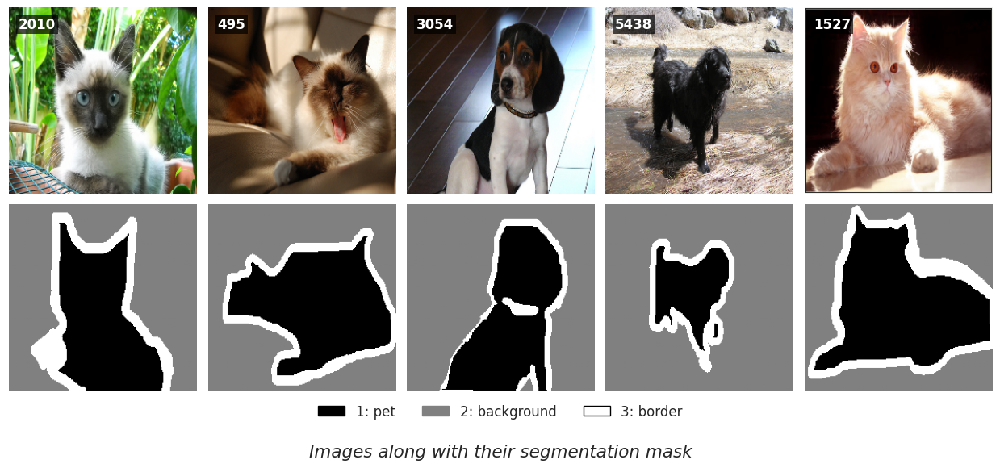

In [12]:
### Échantillon aléatoire d'images avec leurs masques
sampled_images = np.random.choice(dframe.index, size=5, replace=False)
plot_masks(sampled_images)

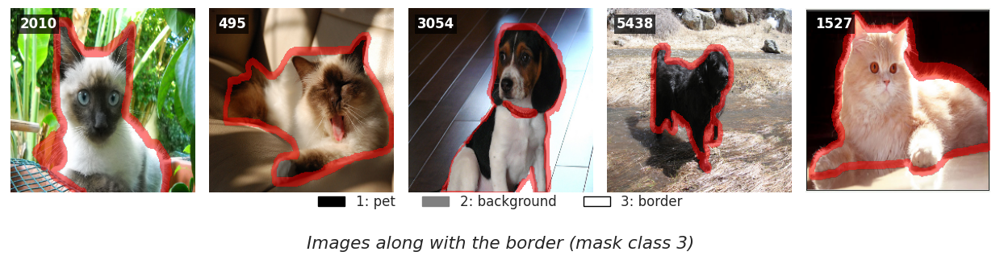

In [13]:
def plot_masks_border_overlap(
    idx: list[int],
    caption: str = "Images along with the border (mask class 3)",
    max_images: int = 20
):

    N_IMAGES = min(len(idx), max_images)
    N_COLS = N_IMAGES if N_IMAGES < 5 else 5
    N_ROWS = 0 if N_IMAGES == 0 else (N_IMAGES - 1) // N_COLS + 1
    FOOTER_SIZE = 0.015

    colors = ["violet", "black", "grey", "white"]    # 0 is unused but matplotlib needs it
    cmap = ListedColormap(colors)                    # Define colors for levels 0, 1, 2, 3
    norm = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], cmap.N) # set boundaries at half-steps

    patches = [
        mpatches.Patch(color="black", label="1: pet"),
        mpatches.Patch(color="grey",  label="2: background"),
        mpatches.Patch(facecolor="white", label="3: border", edgecolor='black', linewidth=1.0),
    ]

    fig = plt.figure(figsize=(2.5*N_COLS, 3.2*N_ROWS + FOOTER_SIZE))
    grid_outer = fig.add_gridspec(2, 1, height_ratios=[2.5*N_ROWS, FOOTER_SIZE])
    grid_inner = grid_outer[0].subgridspec(N_ROWS, N_COLS, wspace=0.05, hspace=0.05)

    for k in range(N_IMAGES):
        image, animal_id, race_id, mask = data[idx[k]].values()
        image = OxfordPetsDataset.default_transform_unnormalize(image)
        mask = mask.squeeze().numpy()

        border_mask = np.zeros((*mask.shape, 4)) # RGBA
        border_mask[mask == 3] = [1, 0, 0, 0.5]  # Rouge avec 50% d'opacité

        row = k // 5
        col = k % 5

        ax = fig.add_subplot(grid_inner[row, col])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis('off')
        ax.imshow(image)
        ax.imshow(border_mask) # Overlap
        ax.text(
            0.05, 0.95, # Coordinates within the subplot (0.0 to 1.0)
            str(idx[k]),
            transform=ax.transAxes,
            color="white",
            fontsize=12,
            fontweight="bold",
            ha="left",
            va="top",
            bbox=dict(facecolor="black", alpha=0.7, edgecolor="none", pad=2)
        )

    footer = fig.add_subplot(grid_outer[1])
    footer.axis('off')

    footer.legend(
        handles=patches,
        loc='center',
        ncol=len(patches), # Display all patches in a single row
        frameon=False, # No box around the legend
        fontsize='large'
    )

    fig.supxlabel(caption, size=15.5, style="italic")
    # fig.subplots_adjust(hspace=0.05)
    fig.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

plot_masks_border_overlap(sampled_images)

Cette troisième classe de bordure est très intéressante, elle semble dénoter soit une bordure entre les deux classes que l'on souhaite trouver lors de la segmentation (pet et background) ou bien une zone d'incertitude/complexité sémantique (comme par exemple un collier qui peut selon l'interprétation faire partie du chien ou non).

Il y a plusieurs possibilités pour cette troisième classe:
- on peut l'ignorer lors de la segmentation, c'est-à-dire que l'on considère que notre réseau pourra assigner la classe qu'il souhaite à ces régions sans impact sur la loss.
- on peut la considérer comme faisant partie de l'animal, voire même lui assigner un poids plus fort afin de mieux préciser les contours.

Comme ici la classe 3 ne superpose pas *que* l'animal en son bord mais est bien une zone de bordure (qui couvre autant l'animal que le fond), la consiérer comme faisant partie de l'animal risque surtout d'entraîner notre modèle à prendre une marge autour des contours de l'animal. Il n'y aurait vraisemblablement pas de gain de précision des contours.

Les pixels avec la classe 3 seront donc ignorés dans la loss pour la segmentation.

On s'intéresse par la suite à la fréquence (ratio) de chaque classe au sein de chaque masque, afin de detecter des anomalies.

On regarde en particulier si certains masques ne contiennent pas l'animal (la classe 1: animal est absente du masque).

In [14]:
### On calcule pour chaque masque la proportion de chaque classe (1, 2, 3)

def __class_ratios():
    # might work with a One-hot trick for fast (batched?) bincount:       
    # oh = torch.nn.functional.one_hot(masks.long(), num_classes=4) # oh: (B, 1, H, W, 4)
    # counts[...] = oh.sum(dim=[1,2,3]).cpu().numpy() # Sum over spatial dims: (B, 4)

    counts = torch.zeros((len(dframe), 3), dtype=torch.int64)
    for row in dframe.itertuples():
        mask = decode_image(row.maskfile)  # H, W - uint8
        counts[row.Index] = torch.bincount(mask.flatten(), minlength=4)[1:4]  # index 0 unused

    ratios = pd.DataFrame(counts, columns=["mask_class1","mask_class2","mask_class3"])
    ratios = ratios.div(ratios.sum(axis=1).replace(0, np.nan), axis=0)
    return ratios

ratios = __class_ratios()
ratios.iloc[130:140]

,mask_class1,mask_class2,mask_class3
130,0.126563,0.800474,0.072962
131,0.107908,0.805443,0.086649
132,0.179839,0.693839,0.126322
133,0.356108,0.508200,0.135692
134,0.107547,0.829811,0.062641
135,0.113489,0.759570,0.126941
136,0.000000,1.000000,0.000000
137,0.142112,0.782523,0.075365
138,0.175719,0.753695,0.070586
139,0.308710,0.567833,0.123457


La 136ième image a un masque de segmentation avec seulement la classe 2 (background) ce qui semble être une anomalie.
Regardons les valeurs que prennent ces ratios de plus près:

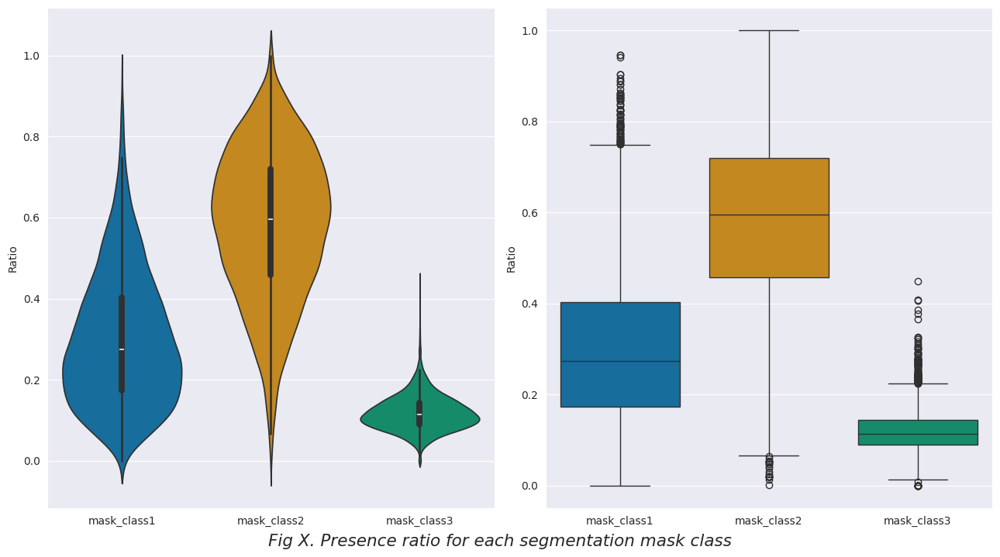

In [15]:
### On regarde les ratios sur les classes de segmentation de plus près

def __plot(ratios):
    fig, (ax1, ax2) = plt.subplots(1, 2, width_ratios=[1, 1], figsize=(13,7))

    ax1 = sn.violinplot(data=ratios, ax=ax1)
    #ax1.set_title("Distribution of mask level ratios")
    ax1.set_ylabel("Ratio")

    ax2 = sn.boxplot(data=ratios, ax=ax2)
    #ax2.set_title("Distribution of mask level ratios")
    ax2.set_ylabel("Ratio")

    fig.tight_layout()
    fig.supxlabel("Fig X. Presence ratio for each segmentation mask class", y=-0.02, size=15.5, style="italic")
    plt.show()

__plot(ratios)

Regardons les extrèmes, donc les masques avec presque exclusivement la classe 1 et 2 et ceux avec un ratio haut de classe 3 (plus de 30%)

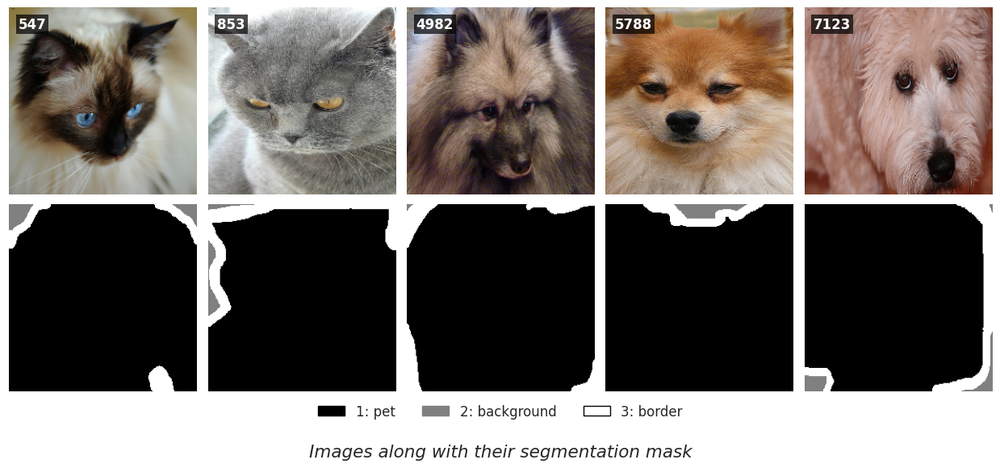

There are 5 images with more than 90% level 1 (pet) in their segmentation mask (big pets)


In [16]:
__mask_1_high = ratios[ratios["mask_class1"] > 0.9].index.values
plot_masks(__mask_1_high)
print(f"There are {len(__mask_1_high)} images with more than 90% level 1 (pet) in their segmentation mask (big pets)")

Les masques comportant plus de 90% de la classe 1 (animal) correspondent juste aux images avec un zoom sur l'animal, qui prend la majorité de l'image. Ce ne sont pas des anomalies.

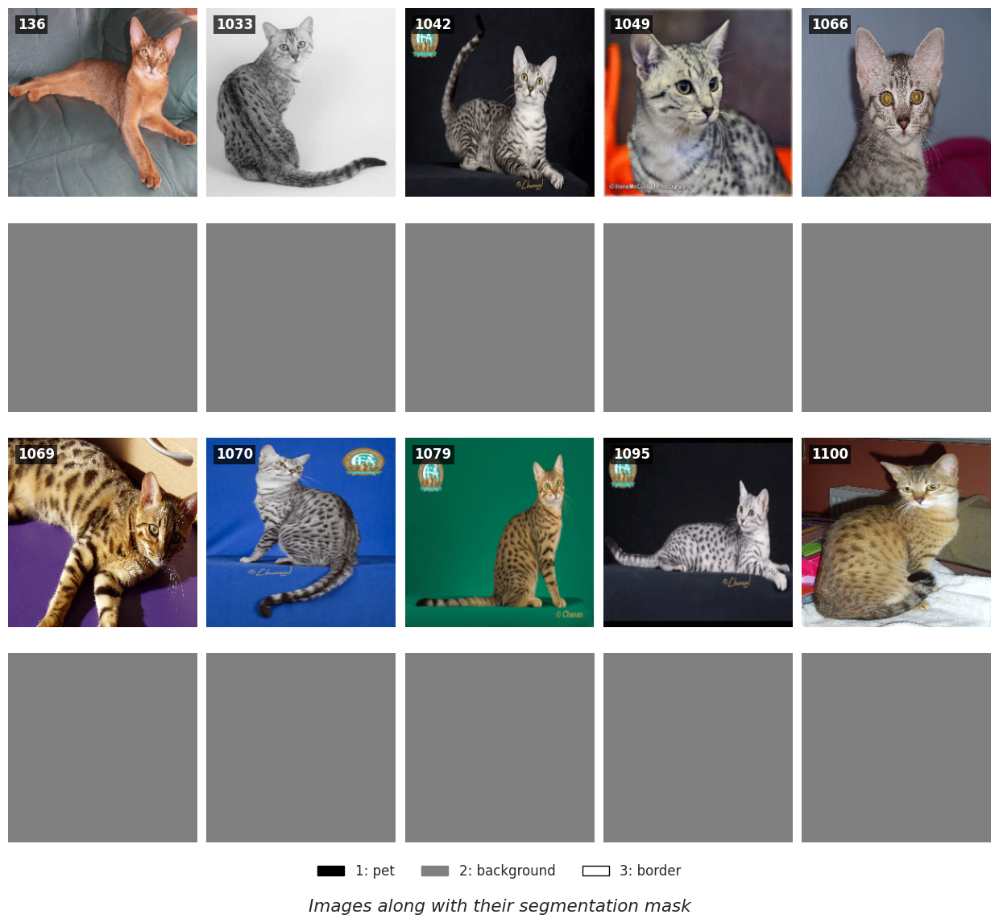

There are 23 images with more than 99% level 2 (background) in their segmentation masks (only background)


In [17]:
__mask_2_full = ratios[ratios["mask_class2"] > 0.99].index.values
plot_masks(__mask_2_full, max_images = 10)
print(f"There are {len(__mask_2_full)} images with more than 99% level 2 (background) in their segmentation masks (only background)")

Les masques avec exclusivement de la classe 2 (background) sont erronés.
Le problème visible semble être principalement sur la race de chat: les Egyptian Mau (id 1033 et plus) mais d'autres images anormales ne sont pas affichées ici.

Après avoir augmenté `max_images` le problème touche plusieurs races.

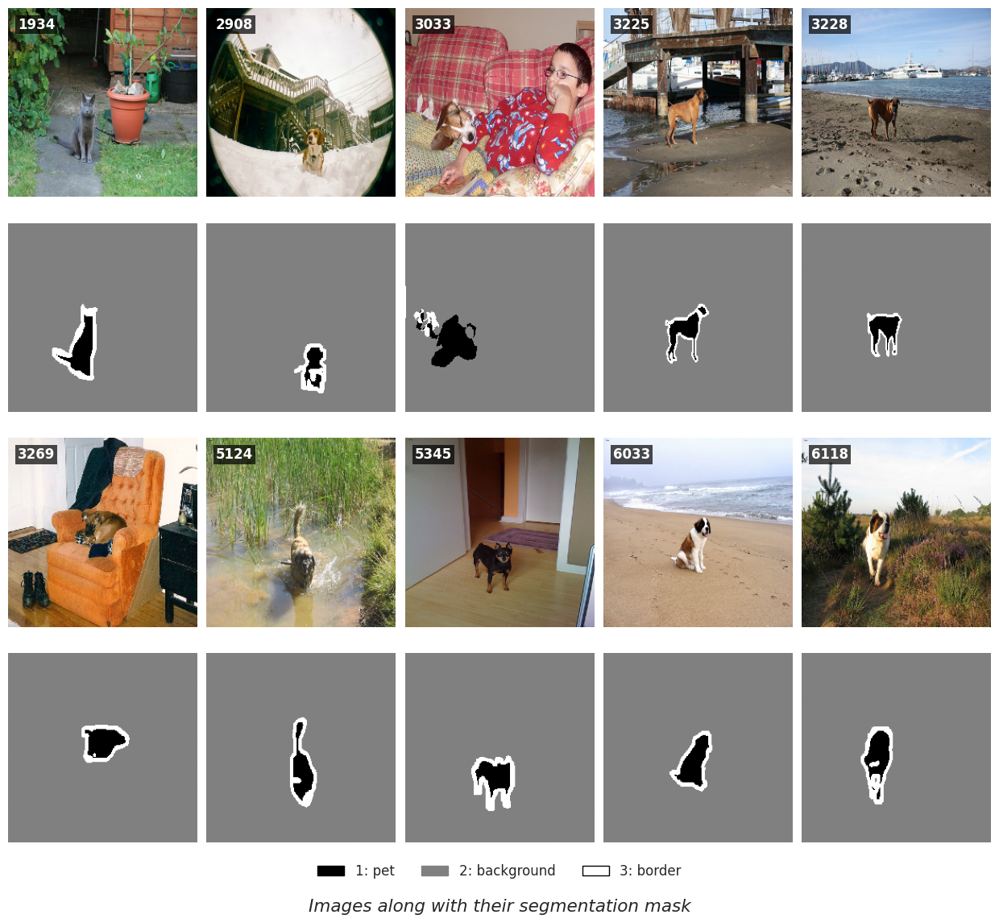

There are 16 non empty (less than 99% of level 2) images with more than 95% level 2 (background) in their segmentation masks (tiny pets)


In [18]:
__mask_2_quasi = ratios[(ratios["mask_class2"] <= 0.99) & (ratios["mask_class2"] > 0.95)].index.values
plot_masks(__mask_2_quasi, max_images = 10)
print(f"There are {len(__mask_2_quasi)} non empty (less than 99% of level 2) images with more than 95% level 2 (background) in their segmentation masks (tiny pets)")

Les masques avec beaucoup de classe 2 (background) mais avec tout de même une présence des autres classes correspondent juste à des images ou les animaux sont petits/loin.

On remarque par contre que le masque de l'image 3033 est bizarre. Il ne suit pas l'organisation des autres masques où la classe 3 (border) sépare la classe 1 (animal) de la classe 2 (background). La classe 3 (border) sert de classe de transition ou de marge si l'on est incertain de la classe à donner.

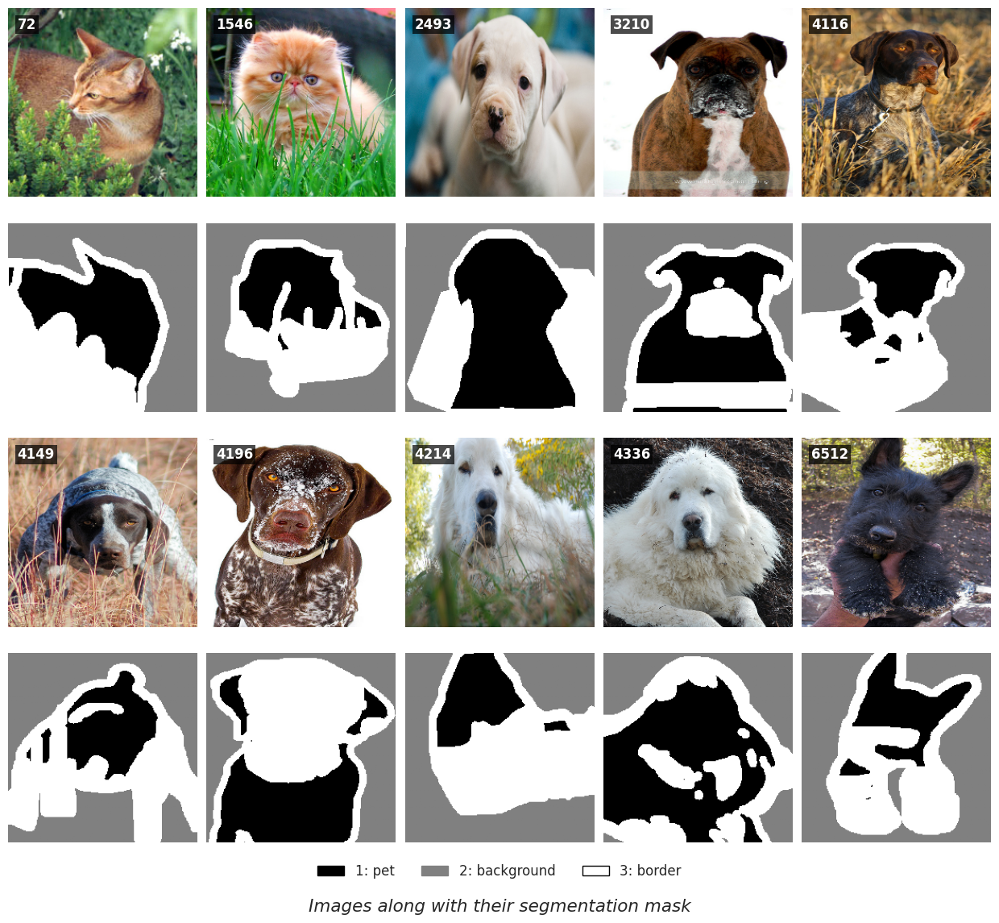

There are 10 images with more than 32% level 3 in their segmentation masks (big borders / unknown zones)


In [19]:
__mask_3_high = ratios[ratios["mask_class3"] > 0.32].index.values
plot_masks(__mask_3_high, max_images = 10)
print(f"There are {len(__mask_3_high)} images with more than 32% level 3 in their segmentation masks (big borders / unknown zones)")

Enfin, les masques avec un ratio comparativement élevé de classe 3 (border) correspondent à des photos prises en extérieur avec de l'herbe, de la boue ou de la neige qui n'est pas juste comptée comme faisant partie de l'animal. Il s'agit surtout de photos présentant une potentielle difficulté pour la segmentation.

Cela risque aussi de biaiser notre modèle si les photos prises en extérieur ou avec ces obstacles sont plus présentes avec une certaine espèce/race.

Regardons à présent si d'autre masques ont un contact direct entre la classe 1 (animal) et la classe 2 (background) comme celui de l'image ID:3033.

In [20]:
### UTILS: count_unusual_touches(mask: torch.Tensor [1, H, W])

def count_unusual_touches(
    mask: torch.Tensor, 
    crop: int = 0, 
    return_touches: bool = False
):

    PET = 1
    BACKGROUND = 2
    BORDER = 3

    mask_background = (mask == BACKGROUND).unsqueeze(0).float()

    kernel = torch.ones(1, 1, 3, 3, device=mask.device)
    proximity = F.conv2d(
        F.pad(mask_background, (1, 1, 1, 1), mode='constant', value=0), 
        kernel
    )

    proximity_mask = (proximity > 0).squeeze().float() # Squeeze back to HxW
    mask_pet = (mask == PET).float()

    # This matrix is 1.0 at every LEVEL_1 pixel that is adjacent to LEVEL_2
    touches_mask = mask_pet * proximity_mask
    touches_mask = touches_mask.squeeze()

    # Optionnally cropping the edge touches
    if crop > 0:
        total_touches = touches_mask[crop:-crop, crop:-crop].sum().item()
    else:
        total_touches = touches_mask.sum().item()

    if return_touches:
        return int(round(total_touches)), touches_mask
    else:
        return int(round(total_touches)), None

In [21]:
### UTILS: plot_masks_and_touches(sr: pd.Series)

def plot_masks_and_touches(
    idx: list[int],
    caption: str = "Images with class 1 touching class 2 directly",
    max_images: int = 10
):

    N_IMAGES = min(len(idx), max_images)
    N_COLS = N_IMAGES if N_IMAGES < 5 else 5
    N_ROWS = 0 if N_IMAGES == 0 else (N_IMAGES - 1) // N_COLS + 1
    FOOTER_SIZE = 0.015

    colors1 = ["violet", "black", "grey", "white"]    # 0 is unused but matplotlib needs it
    cmap1 = ListedColormap(colors1)                    # Define colors for levels 0, 1, 2, 3
    norm1 = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], cmap1.N) # set boundaries at half-steps

    colors2 = ["lightgrey", "red"]
    cmap2 = ListedColormap(colors2)
    norm2 = BoundaryNorm([-0.5, 0.5, 1.5], cmap2.N)

    patches = [
        mpatches.Patch(color="red", label="direct contact"),
        mpatches.Patch(color="black", label="1: pet"),
        mpatches.Patch(color="grey",  label="2: background"),
        mpatches.Patch(facecolor="white", label="3: border", edgecolor='black', linewidth=1.0)
    ]

    fig = plt.figure(figsize=(2.5*N_COLS, 7.95*N_ROWS + FOOTER_SIZE))
    grid_outer = fig.add_gridspec(2, 1, height_ratios=[5*N_ROWS, FOOTER_SIZE])
    grid_inner = grid_outer[0].subgridspec(N_ROWS*3, N_COLS, wspace=0.05, hspace=0.05)

    for k in range(N_IMAGES):
        image, animal_id, race_id, mask = data[idx[k]].values()
        image = OxfordPetsDataset.default_transform_unnormalize(image)
        nb_touches, touches = count_unusual_touches(mask, return_touches=True)
        # touches = touches

        row = k // 5
        col = k % 5

        ax1 = fig.add_subplot(grid_inner[3*row, col])
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.axis('off')
        ax1.imshow(image)
        ax1.text(
            0.05, 0.95, # Coordinates within the subplot (0.0 to 1.0)
            str(idx[k]),
            transform=ax1.transAxes,
            color="white",
            fontsize=12,
            fontweight="bold",
            ha="left",
            va="top",
            bbox=dict(facecolor="black", alpha=0.7, edgecolor="none", pad=2)
        )

        ax2 = fig.add_subplot(grid_inner[3*row + 1, col])
        ax2.imshow(mask.squeeze(), cmap=cmap1, norm=norm1)
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.axis("off")

        ax3 = fig.add_subplot(grid_inner[3*row + 2, col])
        ax3.imshow(touches.squeeze(), cmap=cmap2, norm=norm2)
        ax3.set_xticks([])
        ax3.set_yticks([])
        ax3.axis("off")
        ax3.text(
            0.95, 0.05, # Coordinates within the subplot (0.0 to 1.0)
            "nb="+str(nb_touches),
            transform=ax3.transAxes,
            color="red",
            fontsize=12,
            fontweight="bold",
            ha="right",
            va="bottom",
            bbox=dict(facecolor="black", alpha=0.7, edgecolor="none", pad=2)
        )

    footer = fig.add_subplot(grid_outer[1])
    footer.axis('off')

    footer.legend(
        handles=patches,
        loc='center',
        ncol=len(patches), # Display all patches in a single row
        frameon=False, # No box around the legend
        fontsize='large'
    )

    fig.supxlabel(caption, size=15.5, style="italic")
    # fig.subplots_adjust(hspace=0.05)
    fig.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

In [22]:
# PREND 2-3 MINUTES SUR MON ORDI !
COMPUTE_TOUCHES = False

touches = None 
if COMPUTE_TOUCHES:
    touches = np.zeros(len(dframe), dtype=int)

    for row in dframe.itertuples():
        _, _, _, mask_t = data[row.Index].values()
        touches[row.Index] = count_unusual_touches(mask_t, crop=0)[0]

    touches = pd.Series(touches, name="touches")

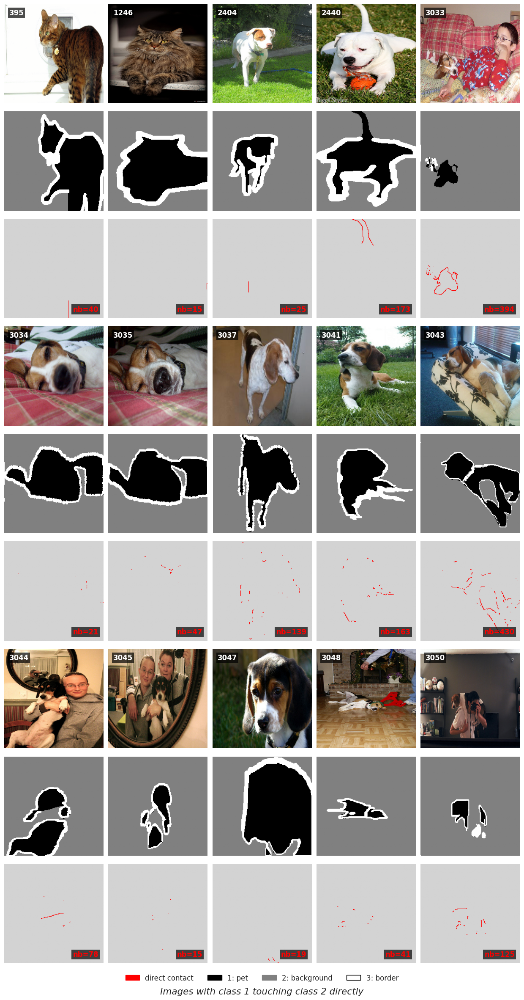

There are 37 images with more then 10 pixels of direct contact between class 1 (animal) and class 2 (background) in their segmentation masks


In [23]:

if touches is None:
    __idx = [395, 1246, 2404, 2440, 3033, 3034, 3035, 3037, 3041, 3043, 3044, 3045, 3047, 3048, 3050, 3051, 3052, 3055, 3056, 3057, 3058, 3059, 3090, 3105, 3112, 3275, 3417, 3507, 3712, 4104, 4225, 4637, 4883, 5271, 6191, 6945, 7066]
else:
    __idx = touches[touches > 10].index.values

plot_masks_and_touches(__idx, max_images=15)
print(f"There are {len(__idx)} images with more then 10 pixels of direct contact between class 1 (animal) and class 2 (background) in their segmentation masks")

This seems to mostly affect dog images (2 cats - 35 dogs). Appart for image 3033 where the organisation of the classes wasn't respected the masks don't look too bad and the general structure of the classes is somewhat respected, the direct touches are small errors and imprecisions. We will keep everything except the image 3033 in the dataset during the segmentation part of the project.

#### I.4 Exclusion des anomalies vues précédemment

Les anomalies détectées touchent les masques de segmentation, elles seront donc enlevées du dataset pour la section sur la segmentation.

In [24]:

# empty masks with only background
__idx_to_remove = ratios[ratios["mask_class2"] > 0.99].index.to_numpy()

# weird masks
__idx_to_remove = np.concatenate((__idx_to_remove, [3033]))


__idx_to_keep = np.setdiff1d(dframe.index.to_numpy(), __idx_to_remove)
identifiers = dframe["identifier"].iloc[__idx_to_keep]

dframe_clean = dframe.iloc[__idx_to_keep]
data_clean = OxfordPetsDataset(
    fetch_masks = True,
    dataset_root = "../data/oxford-pets",
    identifiers = identifiers
)

print(f"""Le dataset sans anomalies \"data_clean\" contient {len(data_clean)} membres, avec:
- les images de chats/chiens
- leurs labels espèce/race 
- les masques de segmentation (animal, arrière-plan, bordure) associés
""")

Le dataset sans anomalies "data_clean" contient 7366 membres, avec:
- les images de chats/chiens
- leurs labels espèce/race 
- les masques de segmentation (animal, arrière-plan, bordure) associés



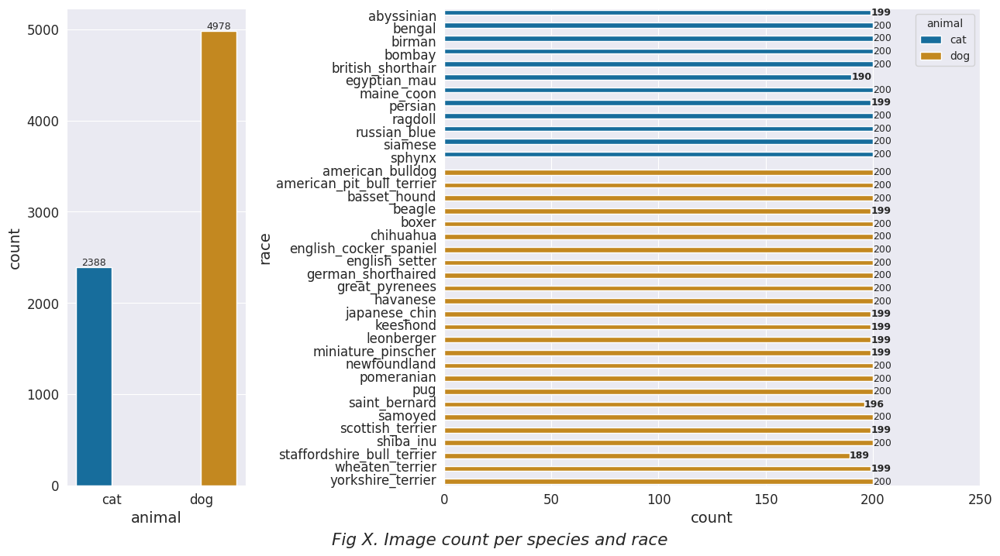

In [25]:
plot_repartition(dframe_clean)

Malgré le nettoyage des anomalies, la répartition des espèces et races n'a sensiblement pas changé. Les conclusions sur la répartition des classes restent les mêmes.

#### I.5 Exploration des biais potentiels

Regardons si sur les photos du dataset les chats ont tendance à être plus petits que sur les photos de chien, une différence dans le zoom pourrait introduire un biai dans l'apprentissage.

In [26]:

def plot_ratio_bias(
    col:str, 
    group:str, 
    selection:list|None=None,
    title: str = "",
    xlabel: str = ""

):
    df_ratios_bias = dframe[["animal", "race"]].join(ratios)

    if selection is not None:
        df_ratios_bias = df_ratios_bias[df_ratios_bias[group].isin(selection)]
        df_ratios_bias[group] = df_ratios_bias[group].cat.remove_unused_categories()


    fig, ax = plt.subplots(figsize=(12, 8))
    sn.kdeplot(data=df_ratios_bias, x=col, hue=group, common_norm=False, alpha=0.5, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    sn.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), ncol=1, title=f"{group}s")
    plt.show()

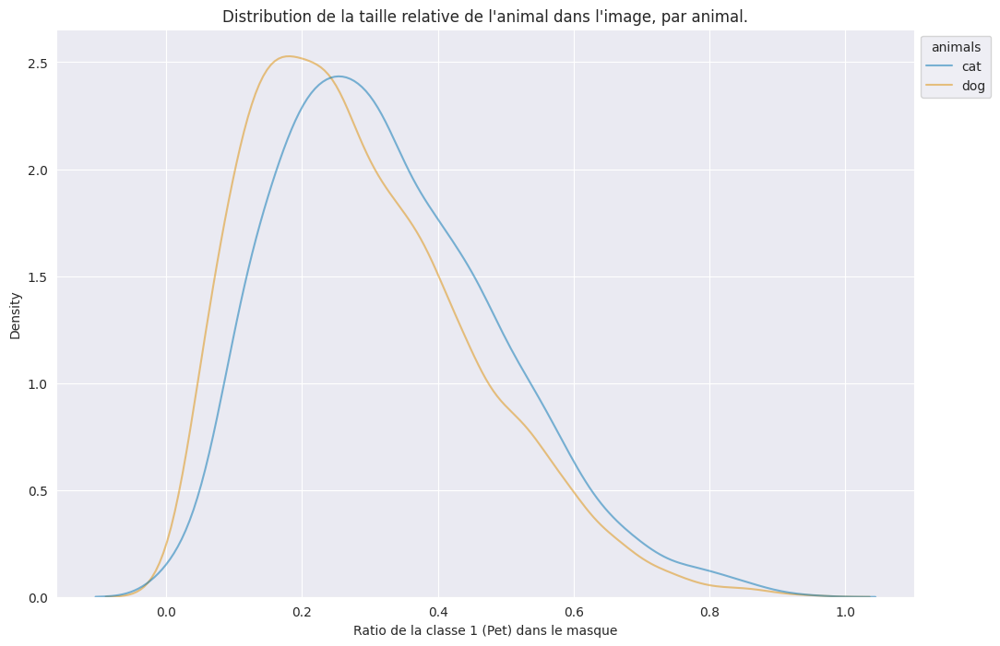

In [27]:
plot_ratio_bias("mask_class1", "animal",
    title = f"Distribution de la taille relative de l'animal dans l'image, par animal.",
    xlabel = "Ratio de la classe 1 (Pet) dans le masque"
)

Regardons aussi si il y a une différence pour les races individuellement.

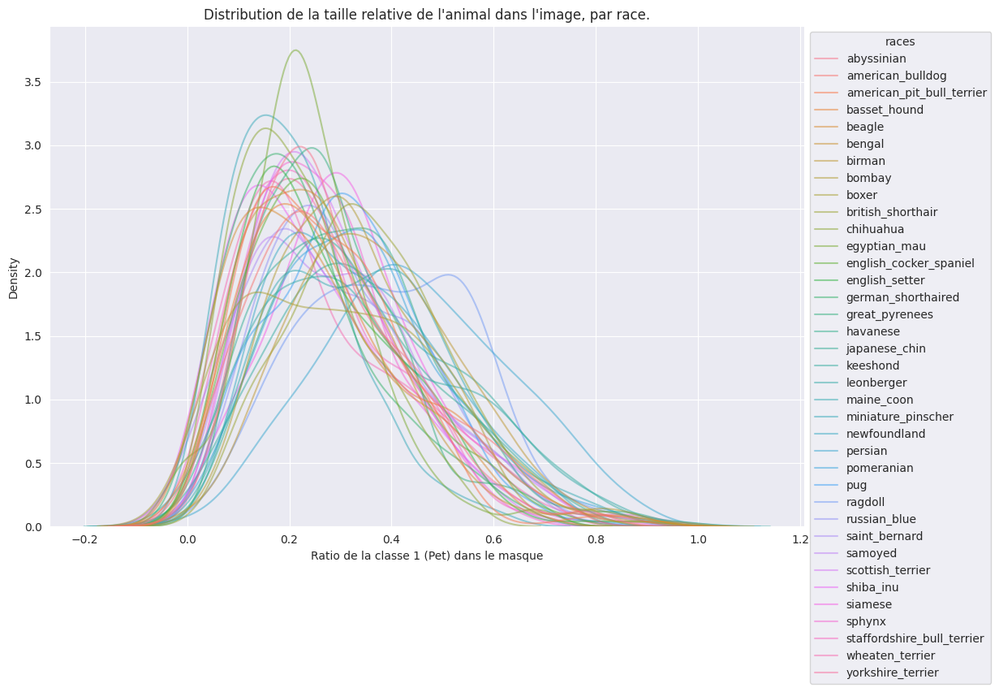

In [28]:
plot_ratio_bias("mask_class1", "race",
    title = f"Distribution de la taille relative de l'animal dans l'image, par race.",
    xlabel = "Ratio de la classe 1 (Pet) dans le masque"
)

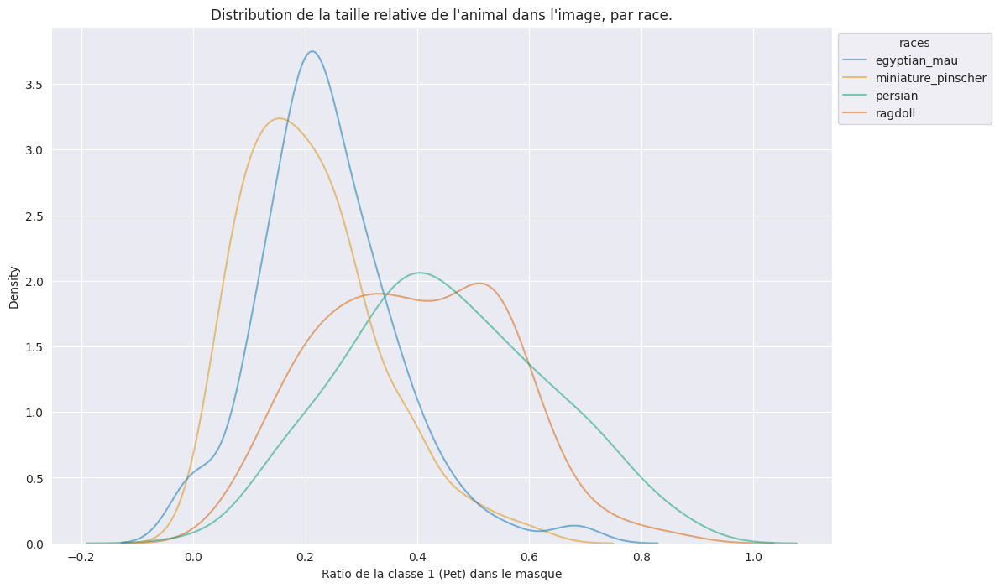

In [29]:
plot_ratio_bias("mask_class1", "race", selection=[
        "persian", "ragdoll", "egyptian_mau", "miniature_pinscher"
    ],
    title = f"Distribution de la taille relative de l'animal dans l'image, par race.",
    xlabel = "Ratio de la classe 1 (Pet) dans le masque"
)

Il y a une difference entre les races, alors que les distributions entre les races semblent simillaires. L'utilisation d'une augmentation `RandomResizedCrop` devrait régler ce problème.

L'herbe et la neige rendent la classe 3 plus présente/rajoute de la complexité sur la classe (animal ou background). Il y a donc potentiellement un biai environnemental. On peut ainsi regarder la différence chien/chat, avec l'idée que les chiens sont peut-être plus pris en photo à l'extérieur que les chats.

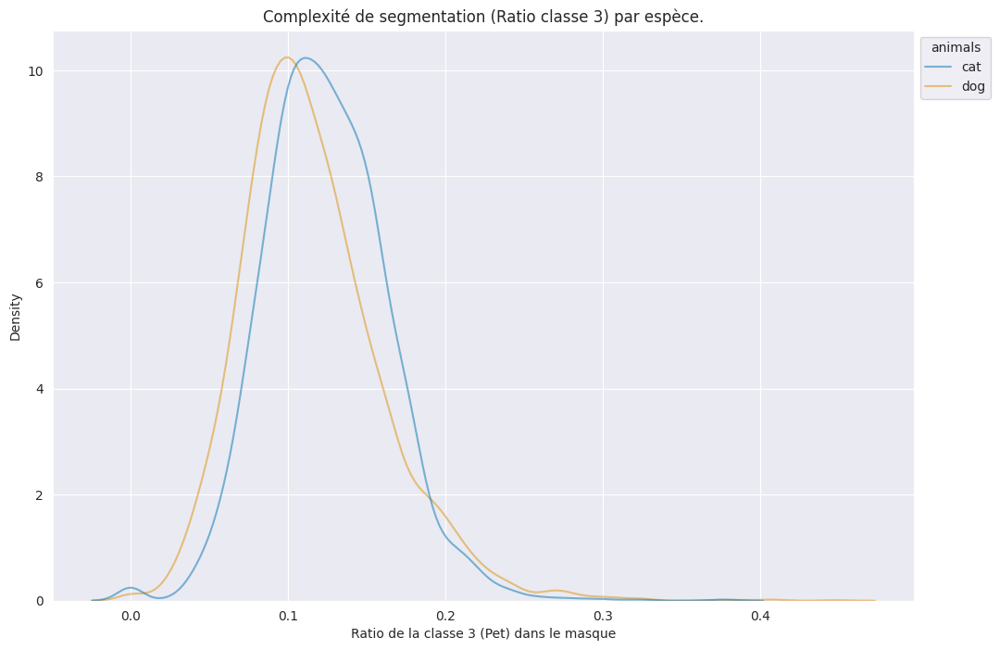

In [30]:
plot_ratio_bias("mask_class3", "animal",
    title = f"Complexité de segmentation (Ratio classe 3) par espèce.",
    xlabel = "Ratio de la classe 3 (Pet) dans le masque"
)

Regardons aussi si il y a une différence pour les races individuellement.

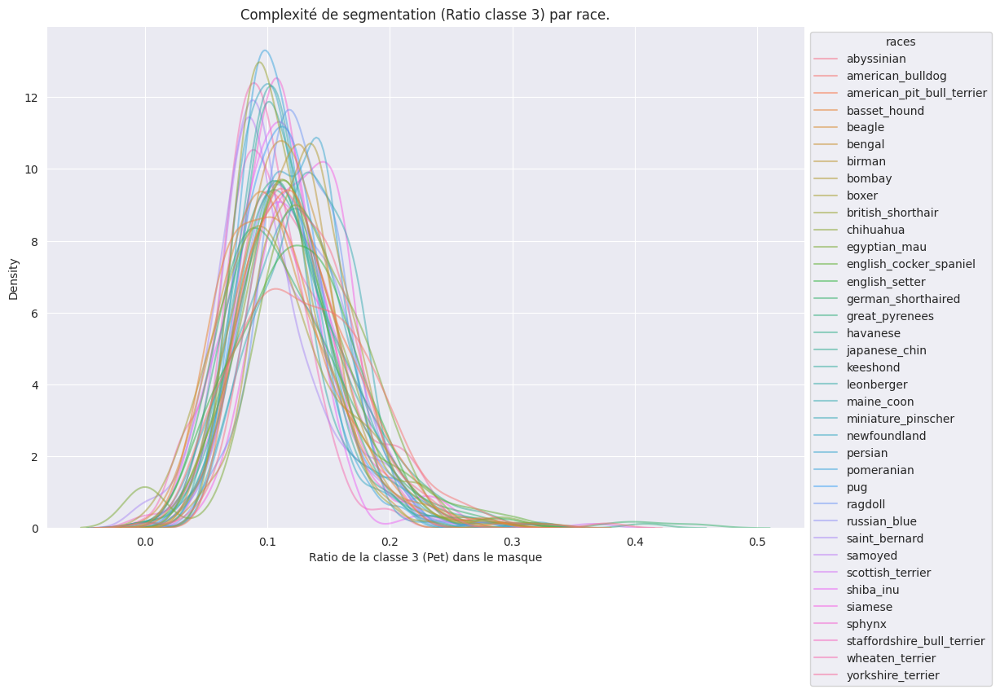

In [31]:
plot_ratio_bias("mask_class3", "race",
    title = f"Complexité de segmentation (Ratio classe 3) par race.",
    xlabel = "Ratio de la classe 3 (Pet) dans le masque"
)

Il y a une différence entre les races, mais elle ne semble pas être trop prononcée.

Regardons à présent si les images ont des tailles ou formats différents selon les classes, car cela pourrait être appris depuis les images transformées.

In [32]:
from pathlib import Path

dimensions = []
for row in dframe.itertuples():
    img = decode_image(row.imagefile)  # H, W - uint8
    
    if isinstance(img, torch.Tensor):
        h, w = img.shape[-2:] # (C, H, W) -> H, W
    else:
        w, h = img.size
    
    identifier = Path(row.imagefile).stem
    
    dimensions.append({
        "width": w,
        "height": h,
        "animal": "Cat" if identifier[0].isupper() else "Dog",
        "race": identifier.rpartition("_")[0]
    })

len(dimensions)

Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


7390

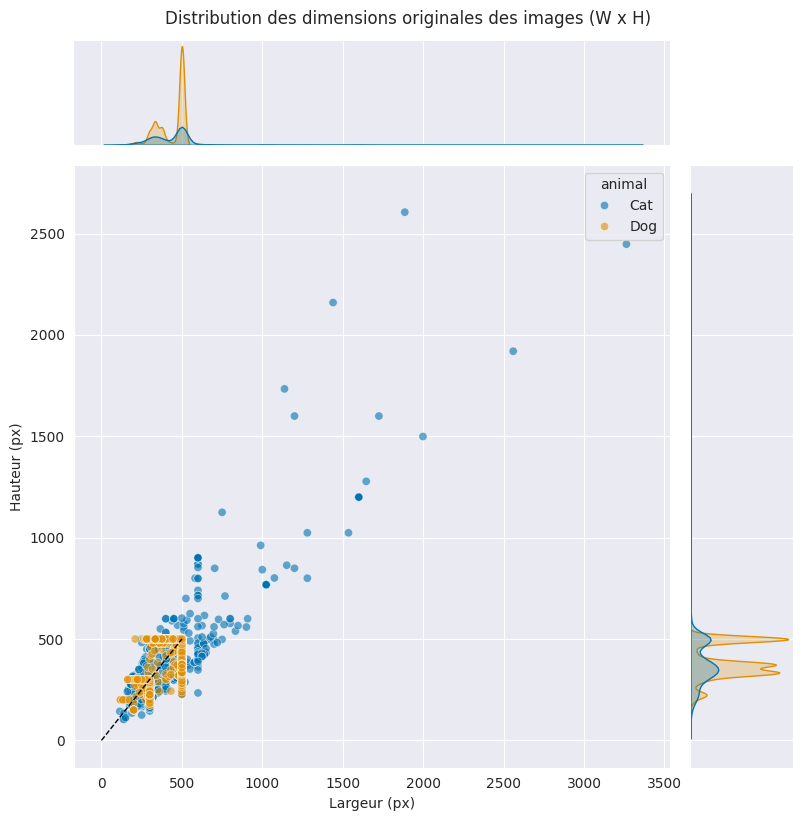

Dimensions moyennes : 437x391
Ratios (W/H) :
count    7390.000000
mean        1.172343
std         0.329376
min         0.420000
25%         0.751116
50%         1.333333
75%         1.492537
max         2.564103
dtype: float64


In [33]:

df_dimensions = pd.DataFrame(dimensions)

g = sn.jointplot(
    data=df_dimensions,
    x="width",
    y="height",
    hue="animal",   
    kind="scatter", 
    alpha=0.6,      
    height=8,
    space=0.2
)

# Ajout d'une ligne pour le ratio carré (1:1) et 4:3 / 16:9 si pertinent
g.ax_joint.plot([0, 500], [0, 500], 'k--', linewidth=1, label="Ratio 1:1")

g.fig.suptitle("Distribution des dimensions originales des images (W x H)", y=1.02)
g.ax_joint.set_xlabel("Largeur (px)")
g.ax_joint.set_ylabel("Hauteur (px)")

plt.show()

print(f"Dimensions moyennes : {df_dimensions['width'].mean():.0f}x{df_dimensions['height'].mean():.0f}")
print("Ratios (W/H) :")
print( (df_dimensions['width'] / df_dimensions['height']).describe() )

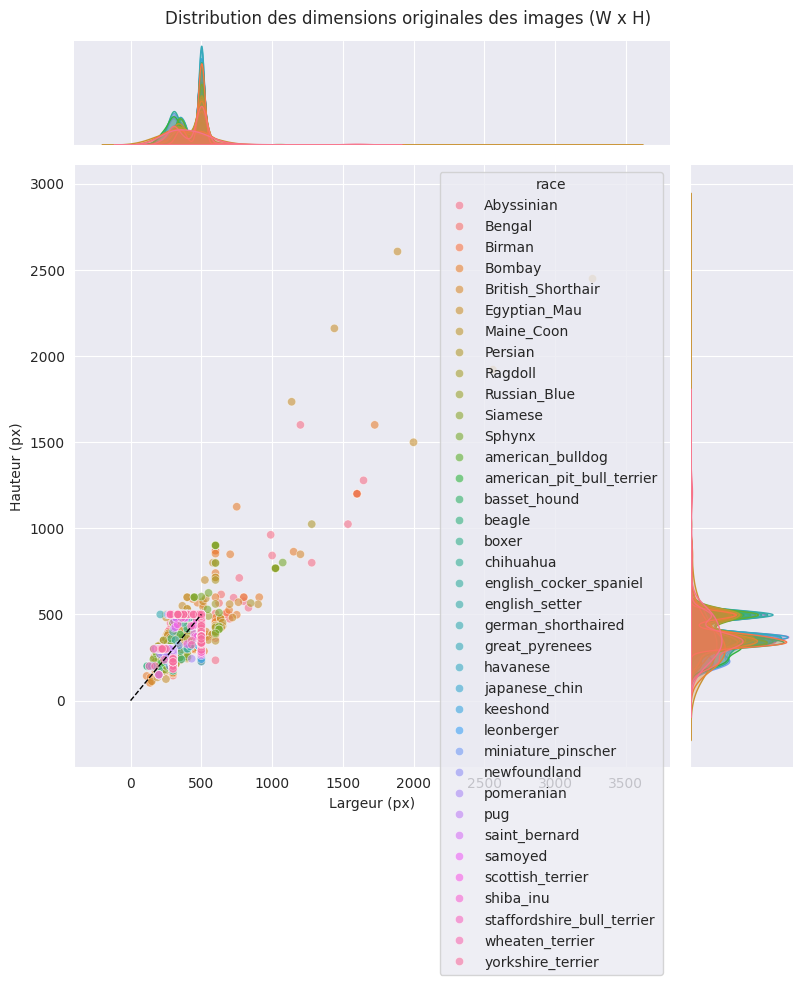

In [34]:
g = sn.jointplot(
    data=df_dimensions,
    x="width",
    y="height",
    hue="race",   # Colore par espèce pour voir les différences
    kind="scatter", # 'kde' est aussi joli si beaucoup de points
    alpha=0.6,      # Transparence pour voir les superpositions
    height=8,
    space=0.2
)

# Ajout d'une ligne pour le ratio carré (1:1) et 4:3 / 16:9 si pertinent
g.ax_joint.plot([0, 500], [0, 500], 'k--', linewidth=1, label="Ratio 1:1")

g.fig.suptitle("Distribution des dimensions originales des images (W x H)", y=1.02)
g.ax_joint.set_xlabel("Largeur (px)")
g.ax_joint.set_ylabel("Hauteur (px)")

plt.show()

Il y une différence entre les espèces sur la taille de l'image, ce qui devrait disparaître avec la transformation. L'aspect ratio est distribué similairement selon les classes et ne devrait pas poser de problèmes. 

#### I.6 Bilan de l'analyse exploratoire

Cette analyse a permis de valider la qualité du jeu de données et d'identifier les stratégies nécessaires pour l'entraînement des modèles de segmentation et de classification.

**1. Qualité des données et nettoyage :**

- **Anomalies détectées :** Environ 1% du dataset présentait des masques de segmentation vides (uniquement de l'arrière-plan) ou corrompus (contact direct anormal entre l'animal et le fond sans bordure de transition). Ces images ont été exclues pour garantir que le modèle ne reçoive pas de signaux contradictoires.

- **Diversité des échelles :** La part occupée par l'animal varie de **5% à 95%** de l'image, et varie selon les classes. Cette grande variabilité nous dirige vers l'utilisation d'augmentations de type `RandomResizedCrop` pour rendre le modèle robuste aux changements sur le zoom de l'animal.


**2. Déséquilibres :**

- Le dataset présente un **déséquilibre au niveau des espèces** (~2/3 de chiens pour ~1/3 de chats). Cependant, la répartition par race est extrêmement stable (~200 images par race), ce qui limite le risque qu'une race spécifique ne domine l'apprentissage au sein d'une espèce.

- **Biais :** Les distributions de la proportion de classe 1 chez les chats et les chiens sont proches, mais ce n'est pas le cas entre les races de façon plus individuelles. Cela pourrait amener le modèle à classifier dans une race plutôt qu'une autre à partir du zoom sur la photo. Cela confirme la nécéssité d'utiliser des augmeentations de type `RandomResizedCrop`.

**3. Rôle critique de la Classe 3 (Bordure/Incertitude) :**

- Plutôt qu'une simple "bordure", la classe 3 agit comme une **zone d'incertitude sémantique**. Elle capture l'aliasing, les textures complexes (poils, herbe, neige) et les séparations floues entre l'animal et son environnement.


**4. Implications pour la suite :**

Robustesse de la classification fine (Race) : Bien qu'il y ait plus de chiens que de chats au total, chaque race individuelle dispose d'un effectif quasi identique (~200 images). Cela signifie que le modèle ne sera pas "biaisé" en faveur d'une race spécifique au détriment d'une autre au sein d'une même espèce. C'est un point positif pour la classification à 37 classes.

Risque de biais de prédiction majoritaire (Espèce) : Le déséquilibre 2/3 chiens (25 races) contre 1/3 chats (12 races) est un point de vigilance pour la classification binaire. Sans précaution, un modèle pourrait obtenir une précision de ~67% en prédisant systématiquement "chien". Comme 67% reste relativement bas nous n'introduiront pas de points dans la cross-entropy pour contrer l'effet du biai, ce que nous aurions fait eu la répartition été plus déséquilibrée.

Pour la segmentation, la gestion de la classe 3 sera déterminante. Lors de l'entraînement, il faudra décider si nous traitons cette classe comme une catégorie à part entière ou si nous utilisons une fonction de coût (Loss) qui ignore ces pixels ambigus pour se concentrer sur les zones de certitude (Pet vs Background).

#### Potentielles améliorations
Une autre exploration des biais qu'il aurait été possible de faire est une analyse de la **Différence de couleur de l'environement**: différencier les chats/chiens et leur race depuis la couleur de leur pelage est normal voire attendu mais si l'environnement à tendence à être différent (plus sombre par exemple) pour une espèce/race en particulier dans le dataset, ou si seuls les chiens sont pris en photos dans de la neige par exemple cela risque d'introduire un biai.

## II. Classification

L'objectif de cette section est de développer un classifieur capable de distinguer les espèces (binaire : chat vs chien) puis dans un deuxième temps un classifieur pouvant distinguer les races (classification fine : 37 catégories). Cette étape sert de fondation pour comprendre comment un réseau extrait des caractéristiques globales avant de passer à la segmentation locale.

#### Préparation des données pour la classification.

En nous basant sur l'analyse exploratoire, nous allons :
- Utiliser un **RandomResizedCrop** pour normaliser les différences de zoom (biais de taille).
- Garder les images avec des anomalies puisque celles-ci ne concernent que les masques de segmentation.
- Nous n'allons pas, pour l'instant, gérer le déséquilibre des classes (2/3 chiens, 1/3 chats) via une fonction de perte pondérée ou un échantillonnage adapté.

In [26]:
augmentation_transform = A.Compose([
    A.RandomResizedCrop(size=(224, 224), scale=(0.7, 1.0), p=1.0),
    A.HorizontalFlip(p=0.5),
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),

    # Shift the colors but I don't think it's a good idea.
    # A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),

    # askip ça aide si pour cetains animaux les photos sont prises avec des 
    # angles bizarres, pas parfaitement droites.
    # A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),

    ToTensorV2()
]) 

In [27]:
data_classif = OxfordPetsDataset(
    fetch_masks = False,
    joint_transform = augmentation_transform,
    dataset_root = "../data/oxford-pets"
)

In [28]:
# can be set to None for random seed
_generator = torch.Generator().manual_seed(42)

# Split Train/Val (80% / 20%)
_train_size = int(0.8 * len(data_classif))
_val_size = len(data_classif) - _train_size

subset_classif_train, subset_classif_val = torch.utils.data.random_split(
    data_classif, [_train_size, _val_size], 
    generator = _generator
)

In [29]:
loader_classif_train = DataLoader(subset_classif_train, batch_size=32, shuffle=True)
loader_classif_val = DataLoader(subset_classif_val, batch_size=32, shuffle=False)

### II.A Classification binaire (chien/chat)

Dans cette partie, nous comparons quatre architectures pour valider l'efficacité du Transfer Learning par rapport à une approche from scratch sur le classifieur bianire.
Les modèles utilisés seront:
- Un "VGG-8" In-House : Un modèle simplifié avec 3 blocs de convolution et un classifieur dense de 1024 neurones. Ce modèle sert de base de référence (baseline) pour évaluer la complexité nécessaire à la tâche.
- Les modèles VGG-16, ResNet18 & MobileNetV3 : Ces modèles pré-entraînés bénéficient de connaissances acquises sur ImageNet. Nous allons remplacer leurs couches finales pour une sortie binaire et les fine-tuner sur nos données.

#### II.A.1 Classification binaire \[in-house \"VGG-8\"\].

In [42]:
### Model definition: simple in-house VGG (VGG-8))
import torch.nn as nn

class Model_VGG8_InHouse(nn.Module):

        def __init__(self, num_classes=2, input_channels=3):
            super(Model_VGG8_InHouse, self).__init__()

            self.features = nn.Sequential(

                # Block 1
                nn.Conv2d(input_channels, 64, kernel_size=3, padding=1), 
                nn.BatchNorm2d(64),       # <--- AJOUT de BatchNorm2d pour aider la classif fine
                nn.ReLU(inplace=True),
                nn.Conv2d(64, 64, kernel_size=3, padding=1), 
                nn.BatchNorm2d(64),       # <--- AJOUT de BatchNorm2d pour aider la classif fine
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),

                # Block 2
                nn.Conv2d(64, 128, kernel_size=3, padding=1), 
                nn.BatchNorm2d(128),      # <--- AJOUT de BatchNorm2d pour aider la classif fine
                nn.ReLU(inplace=True),
                nn.Conv2d(128, 128, kernel_size=3, padding=1), 
                nn.BatchNorm2d(128),      # <--- AJOUT de BatchNorm2d pour aider la classif fine
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),

                # Block 3
                nn.Conv2d(128, 256, kernel_size=3, padding=1), 
                nn.BatchNorm2d(256),      # <--- AJOUT de BatchNorm2d pour aider la classif fine
                nn.ReLU(inplace=True),
                nn.Conv2d(256, 256, kernel_size=3, padding=1), 
                nn.BatchNorm2d(256),      # <--- AJOUT de BatchNorm2d pour aider la classif fine
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2),
                
            )

            self.avgpool = nn.AdaptiveAvgPool2d((7, 7))

            self.classifier = nn.Sequential(
                nn.Linear(256 * 7 * 7, 1024), 
                nn.ReLU(inplace=True), 
                nn.Dropout(0.5),
                nn.Linear(1024, num_classes),
            )

        def forward(self, x):
            x = self.features(x)
            x = self.avgpool(x)
            x = torch.flatten(x, 1)
            x = self.classifier(x)
            return x

In [ ]:
from torchinfo import summary as model_summary

model_2A1 = Model_VGG8_InHouse(num_classes=2)

In [56]:
model_summary(model_2A1, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
Model_VGG8_InHouse                       [1, 2]                    --
├─Sequential: 1-1                        [1, 256, 28, 28]          --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

In [31]:
def train_model_classif(model, train_loader, val_loader, criterion, optimizer, epochs=5, label_key="animal_id"):

        history = {"train_loss": [], "validation_accuracy": []}
        model.to(device)

        for epoch in range(epochs):

            # Phase d'entraînement
            model.train()
            running_loss = []
            pbar = tqdm(train_loader, desc=f"[train] epoch {epoch+1}/{epochs}")

            for batch in pbar:
                images = batch["image"].to(device)
                labels = batch[label_key].to(device).long()

                optimizer.zero_grad()
                outputs = model(images)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                running_loss.append(loss.item())
                pbar.set_postfix({"mean loss": f"{mean(running_loss):.04f}"})

            # Phase de validation
            model.eval()
            correct, total = 0, 0
            pbar2 = tqdm(val_loader, desc=f"[validation] on validation data")

            with torch.no_grad():
                for batch in pbar2:
                    images = batch["image"].to(device)
                    labels = batch[label_key].to(device).long()

                    outputs = model(images)
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()

                    accuracy = 100 * correct / total
                    pbar2.set_postfix({"accuracy": f"{accuracy:.03f}% "})

            accuracy = 100 * correct / total
            history["train_loss"].append(mean(running_loss))
            history["validation_accuracy"].append(accuracy)

        print(f"training step completed.")
        return history

In [32]:
training_results = {}

In [50]:
def _train_model_2A1():

    print()
    print(f"using device: {device}")
    model_2A1.to(device)

    training_results["2A1"] = train_model_classif(
        model_2A1, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2A1.parameters(), lr=0.001),
        label_key="animal_id",
        epochs=10
    )


_train_model_2A1()
torch.save(model_2A1.state_dict(), 'weights/model_2A1.pth')
print("Model saved to weights/model_2A1.pth")


using device: cuda


[train] epoch 1/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2A1.pth


#### II.A.2 Classification binaire depuis un modèle pré-entrainé \[VGG-16\].

In [ ]:
# On utilise un ResNet18 pré-entraîné
model_2A2 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)

# On remplace la toute dernière couche du bloc 'classifier' (index 6)
# pour une classification binaire (2 sorties)
# in_features est généralement 4096 pour VGG16
model_2A2.classifier[6] = torch.nn.Linear(model_2A2.classifier[6].in_features, 2)

In [57]:
model_summary(model_2A2, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 2]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

In [52]:
def _train_model_2A2():

    print()
    print(f"using device: {device}")
    model_2A2.to(device)

    ### Classifier training
    for param in model_2A2.parameters(): # 1. On gèle tous les paramètres
        param.requires_grad = False

    for param in model_2A2.classifier.parameters(): # 2. On dégèle la couche de classification
        param.requires_grad = True

    training_results["2A2"] = train_model_classif(
        model_2A2, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2A2.parameters(), lr=0.001),
        label_key="animal_id",
        epochs=5
    )

    ### Fine-tuning
    for param in model_2A2.parameters():  # 2. On débloque tous les params
        param.requires_grad = True

    training_results["2A2_ft"] = train_model_classif(
        model_2A2, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2A2.parameters(), lr=0.00001),
        label_key="animal_id",
        epochs=5
    )


_train_model_2A2()
torch.save(model_2A2.state_dict(), 'weights/model_2A2.pth')
print("Model saved to weights/model_2A2.pth")


using device: cuda


[train] epoch 1/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.


[train] epoch 1/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2A2.pth


#### II.A.3 Classification binaire depuis un modèle pré-entrainé \[ResNet18\].

In [ ]:
# On utilise un ResNet18 pré-entraîné
model_2A3 = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

# On remplace la dernière couche (FC) pour une classification chien/chat (2 sorties)
model_2A3.fc = torch.nn.Linear(model_2A3.fc.in_features, 2)

In [58]:
model_summary(model_2A3, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 2]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         128
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]           --
│

In [54]:
def _train_model_2A3():

    print()
    print(f"using device: {device}")
    model_2A3.to(device)

    ### Classifier training
    for param in model_2A3.parameters(): # 1. On gèle tous les paramètres
        param.requires_grad = False

    for param in model_2A3.fc.parameters(): # 2. On dégèle la couche de classification
        param.requires_grad = True

    training_results["2A3"] = train_model_classif(
        model_2A3, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2A3.parameters(), lr=0.001),
        label_key="animal_id",
        epochs=5
    )

    ### Fine-tuning
    for param in model_2A3.parameters():  # 2. On débloque tous les params
        param.requires_grad = True

    training_results["2A3_ft"] = train_model_classif(
        model_2A3, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2A3.parameters(), lr=0.00001),
        label_key="animal_id",
        epochs=5
    )


_train_model_2A3()
torch.save(model_2A3.state_dict(), 'weights/model_2A3.pth')
print("Model saved to weights/model_2A3.pth")


using device: cuda


[train] epoch 1/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.


[train] epoch 1/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2A3.pth


#### II.A.4 Classification binaire depuis un modèle pré-entrainé \[MobileNetV3\].

In [ ]:
# On utilise un MobileNetV3 pré-entraîné
model_2A4 = models.mobilenet_v3_small(weights=models.MobileNet_V3_Small_Weights.DEFAULT)

# On remplace la dernière couche (FC) pour une classification chien/chat (2 sorties)
model_2A4.classifier[3] = torch.nn.Linear(model_2A4.classifier[3].in_features, 2)

In [59]:
model_summary(model_2A4, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV3                                        [1, 2]                    --
├─Sequential: 1-1                                  [1, 576, 7, 7]            --
│    └─Conv2dNormActivation: 2-1                   [1, 16, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 16, 112, 112]         432
│    │    └─BatchNorm2d: 3-2                       [1, 16, 112, 112]         32
│    │    └─Hardswish: 3-3                         [1, 16, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 56, 56]           --
│    │    └─Sequential: 3-4                        [1, 16, 56, 56]           744
│    └─InvertedResidual: 2-3                       [1, 24, 28, 28]           --
│    │    └─Sequential: 3-5                        [1, 24, 28, 28]           3,864
│    └─InvertedResidual: 2-4                       [1, 24, 28, 28]           --
│    │    └─Sequential: 3-6   

In [60]:
def _train_model_2A4():

    print()
    print(f"using device: {device}")
    model_2A4.to(device)

    ### Classifier training
    for param in model_2A4.parameters(): # 1. On gèle tous les paramètres
        param.requires_grad = False

    for param in model_2A4.classifier.parameters(): # 2. On dégèle la couche de classification
        param.requires_grad = True

    training_results["2A4"] = train_model_classif(
        model_2A4, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2A4.parameters(), lr=0.001),
        label_key="animal_id",
        epochs=5
    )

    ### Fine-tuning
    for param in model_2A4.parameters():  # 2. On débloque tous les params
        param.requires_grad = True

    training_results["2A4_ft"] = train_model_classif(
        model_2A4, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2A4.parameters(), lr=0.00001),
        label_key="animal_id",
        epochs=5
    )


_train_model_2A4()
torch.save(model_2A4.state_dict(), 'weights/model_2A4.pth')
print("Model saved to weights/model_2A4.pth")


using device: cuda


[train] epoch 1/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.


[train] epoch 1/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/5:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2A4.pth


#### II.A.5 Comparaison des modèles.

In [64]:
import pickle

with open("weights/training_results.pickle", 'wb') as handle:
    pickle.dump(training_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
models_map = {
    "2A1": (model_2A1, "In-House VGG-8"),
    "2A2": (model_2A2, "Pre-Trained VGG-16"),
    "2A3": (model_2A3, "Pre-Trained ResNet18"),
    "2A4": (model_2A4, "Pre-Trained MobileNetV3"),
}

In [56]:
def plot_comparison(results):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    for iter, (name, hist) in enumerate(results.items()):
        
        color = plt.cm.Set1(iter / (len(models_map) + 1))
        
        if name in models_map:
            ax1.plot(hist["train_loss"], color=color, label=f"{models_map[name][1]}")
            ax2.plot(hist["validation_accuracy"], color=color, label=f"{models_map[name][1]}")
            
            if name+"_ft" in results:
                hist_ft = results[name+"_ft"]
                
                n0 = len(hist["train_loss"])
                n1 = len(hist_ft["train_loss"])
                x = list(range(n0-1, n0+n1))

                ax1.plot(x, [hist["train_loss"][-1]] + hist_ft["train_loss"], color=color, linestyle=':', label=None)
                ax2.plot(x, [hist["validation_accuracy"][-1]] + hist_ft["validation_accuracy"], color=color, linestyle=':', label=None)

    ax1.set_title("Perte d'Entraînement (loss)")
    ax1.set_xlabel("Époque")
    ax1.legend()

    ax2.set_title("Exactitude de Validation (accuracy)")
    ax2.set_xlabel("Époque")
    ax2.set_ylabel("%")
    ax2.legend()

    plt.show()

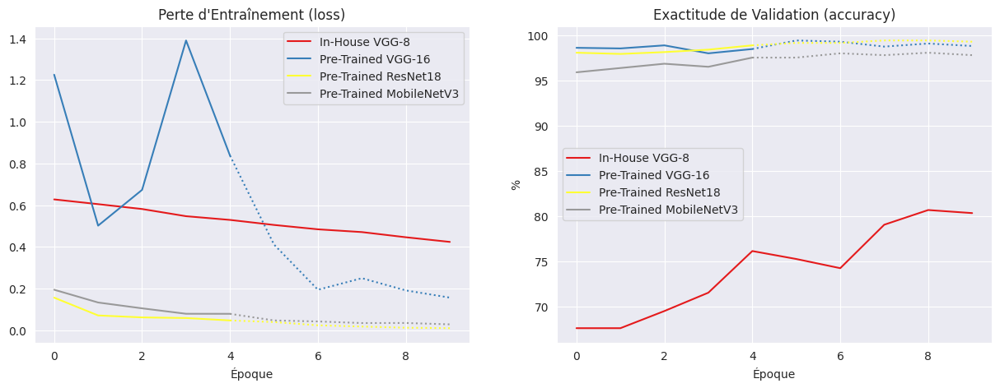

In [ ]:
# with open('weights/training_results.pickle', 'rb') as handle:
#     training_results = pickle.load(handle)

plot_comparison(training_results)

A cause du temps limité, les modèles ont tournés sur seulement 10 époques, dont 5 de fine-tuning pour les modèles pré-entraïnés. On peut voir que le modèle "fait-maison" VGG-8 n'a pas encore convergé et peux encore s'améliorer avec plsu d'époques.

In [69]:
pd.DataFrame({
    "model": [
        "In-House VGG-8", 
        "Pre-Trained VGG-16", 
        "Pre-Trained ResNet18", 
        "Pre-Trained MobileNetV3"
    ],
    "params": [
        sum(p.numel() for p in model_2A1.parameters()),
        sum(p.numel() for p in model_2A2.parameters()),
        sum(p.numel() for p in model_2A3.parameters()),
        sum(p.numel() for p in model_2A4.parameters())
    ],
    "training loss": [
        training_results["2A1"]["train_loss"][-1],
        training_results["2A2"]["train_loss"][-1],
        training_results["2A3"]["train_loss"][-1],
        training_results["2A4"]["train_loss"][-1]
    ],
    "validation accuracy": [
        training_results["2A1"]["validation_accuracy"][-1],
        training_results["2A2"]["validation_accuracy"][-1],
        training_results["2A3"]["validation_accuracy"][-1],
        training_results["2A4"]["validation_accuracy"][-1]
    ]
})

,model,params,training loss,validation accuracy
0,In-House VGG-8,13993538,0.423758,80.311231
1,Pre-Trained VGG-16,134268738,0.837618,98.443843
2,Pre-Trained ResNet18,11177538,0.047097,98.849797
3,Pre-Trained MobileNetV3,1519906,0.078844,97.496617


In [69]:
import sklearn.metrics as metrics

races = dframe_clean["race"].cat.categories.to_numpy()

def plot_classification_results(model, label_key="animal_id"):

    model.eval()
    all_preds = []
    all_labels = []

    ticks = ["cat", "dog"] if label_key=="animal_id" else races

    with torch.no_grad():
        for res in DataLoader(subset_classif_val, batch_size=32):
            images = res["image"].to(device)
            labels = res[label_key].to(device)
            outputs = model(images)

            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = metrics.confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(12, 10))
    sn.heatmap(cm, xticklabels=[f"{t} (pred)" for t in ticks], yticklabels=[f"{t} (true)" for t in ticks], annot=True, fmt="d", cmap="Blues") 
    plt.title("Matrice de Confusion - Classification")
    plt.show()

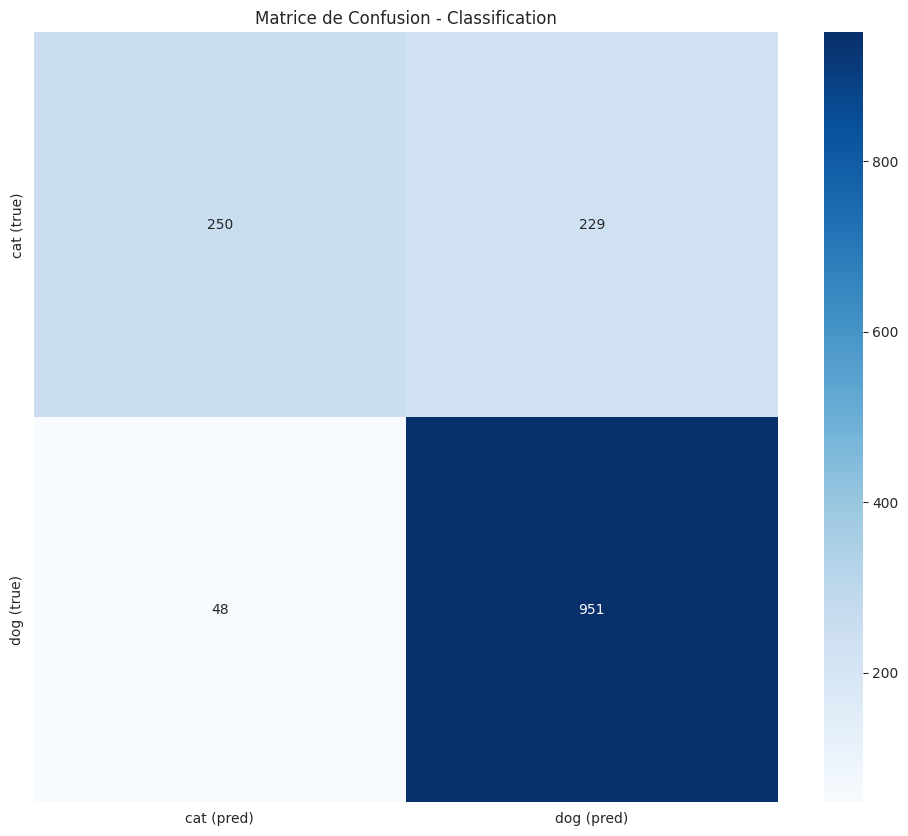

In [81]:
plot_classification_results(model_2A1, label_key="animal_id")

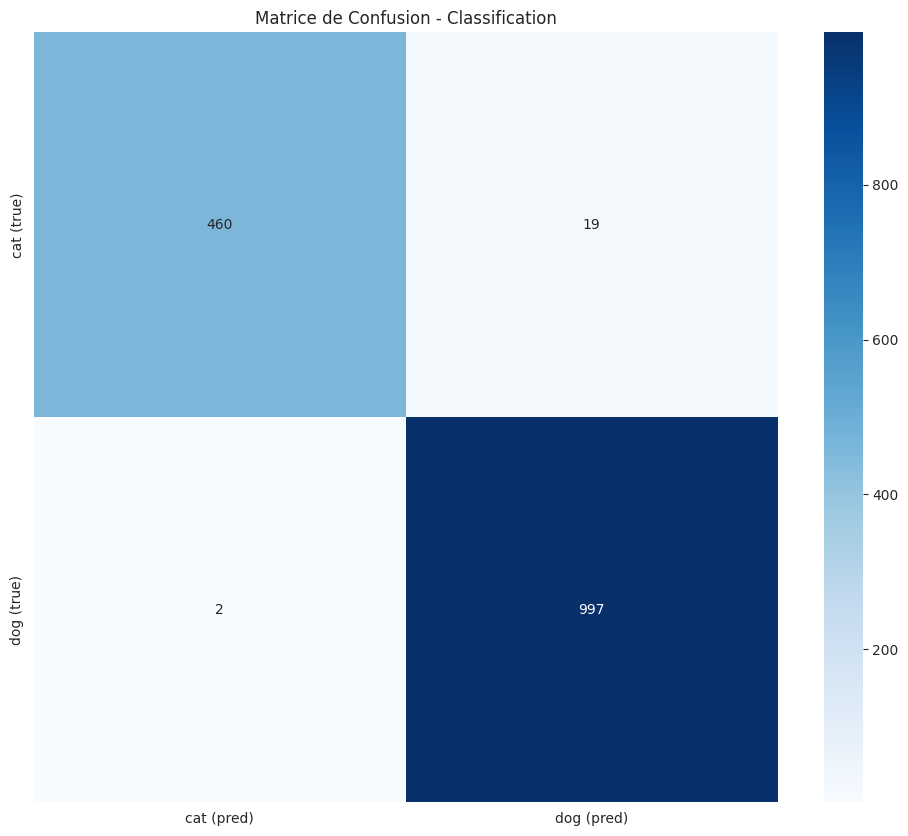

In [82]:
plot_classification_results(model_2A2, label_key="animal_id")

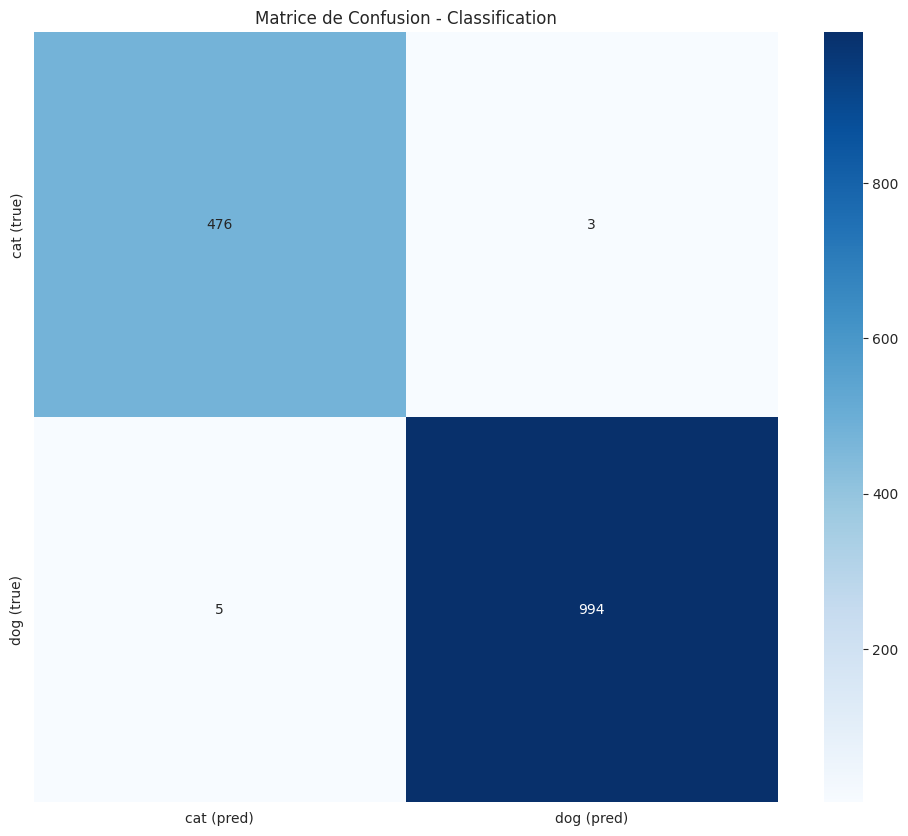

In [83]:
plot_classification_results(model_2A3, label_key="animal_id")

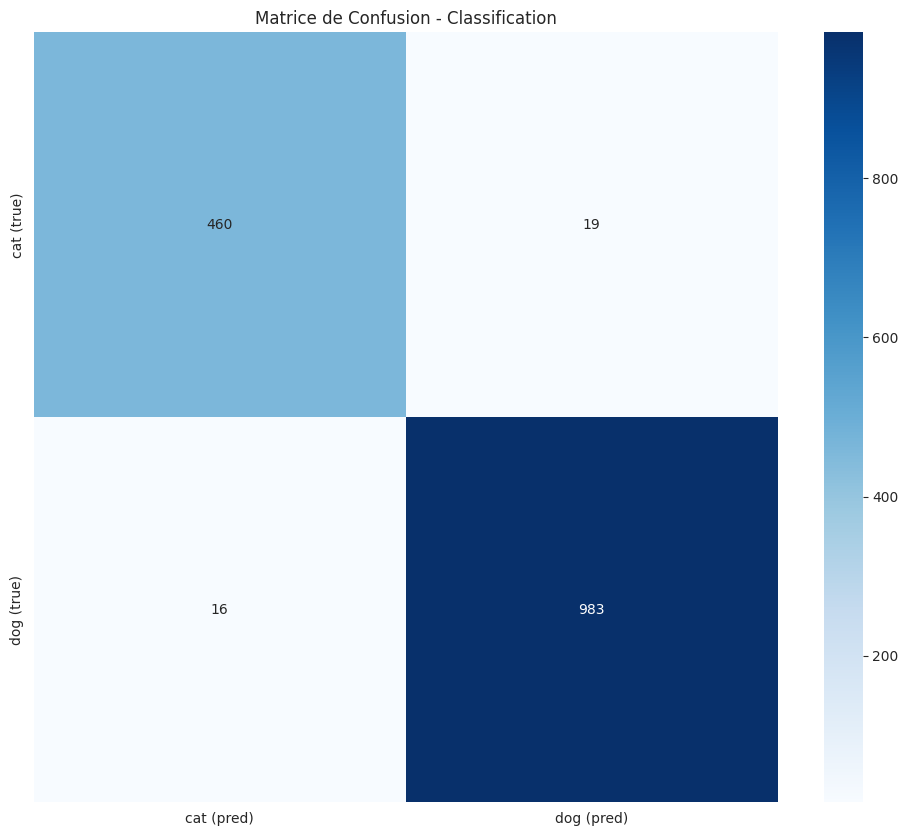

In [84]:
plot_classification_results(model_2A4, label_key="animal_id")

#### Conclusion de la Partie II.A : Classification Binaire

Cette première étape de classification binaire nous a permis de valider plusieurs hypothèses fondamentales avant d'aborder la segmentation.

1. Sans surprise, les modèles pré-entraînés (VGG-16, ResNet18, MobileNetV3) surclassent largement notre modèle "maison" VGG-8 entraîné from scratch, en quelque époques seulement.
    On s'attend aussi à ce que le modèle from scratch plafonne rapidement et montre des signes de difficulté à généraliser avec ce volume de données.
    Les modèles pré-entraînés atteignent très vite une convergence excellente (>95% d'accuracy), bénéficiant des caractéristiques visuelles (textures de fourrure, formes d'oreilles, etc.) déjà apprises sur ImageNet.

2. Bien que VGG-16 offre d'excellentes performances, il est extrêmement lourd en paramètres (~138M) et plus lent à l'inférence.
    ResNet18 (~11M paramètres) et MobileNetV3 (~3M paramètres) offrent des performances quasi-identiques, voire supérieures pour ResNet18, un peu inférieures pour MobileNetV3, pour une fraction du coût de calcul.
    MobileNetV3 se distingue particulièrement par son ratio performance/taille, ce à quoi nous nous attendions et c'est pourquoi nous l'avons utilisés.

3. L'analyse des matrices de confusion montre que le déséquilibre initial du dataset (2/3 chiens, 1/3 chats) n'a pas empêché les modèles pré-entraînés d'apprendre correctement la classe minoritaire ("Chat").

### II.B Classification fine (par race)

La classification par race est une tâche plus difficile en raison de la forte similarité inter-classes (ex: deux races de terriers, ou Abyssinian vs. Bengal pour les chats).

Dans cette partie, nous comparons les même modèles que durant la partie précédents, avec cette fois des couches finales avec 37 logits en sorties.
Les modèles utilisés sont donc toujours:
- Un "VGG-8" In-House : Un modèle simplifié avec 3 blocs de convolution et un classifieur dense de 1024 neurones.
- Les modèles VGG-16, ResNet18 & MobileNetV3 : Les modèles pré-entraînés.

#### II.B.1 Classification fine (37 races) \[in-house \"VGG-8\"\].

Pour la classification fine le VGG in-house à été modifié pour avoir des opération BatchNorm2d après les convolutions. Autrement le modèle stagnait dès le départ et n'arrivait pas à faire mieux que le hasard.

In [43]:
from torchinfo import summary as model_summary
races = dframe_clean["race"].cat.categories.to_numpy()

model_2B1 = Model_VGG8_InHouse(num_classes=len(races))
model_summary(model_2B1, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
Model_VGG8_InHouse                       [1, 37]                   --
├─Sequential: 1-1                        [1, 256, 28, 28]          --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─BatchNorm2d: 2-2                  [1, 64, 224, 224]         128
│    └─ReLU: 2-3                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-4                       [1, 64, 224, 224]         36,928
│    └─BatchNorm2d: 2-5                  [1, 64, 224, 224]         128
│    └─ReLU: 2-6                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-7                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        73,856
│    └─BatchNorm2d: 2-9                  [1, 128, 112, 112]        256
│    └─ReLU: 2-10                        [1, 128, 112, 112]        --
│    └─Conv2d: 2-11                      [1, 128, 112, 112]        147,

In [44]:
def _train_model_2B1():

    print()
    print(f"using device: {device}")
    model_2B1.to(device)

    training_results["2B1"] = train_model_classif(
        model_2B1, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2B1.parameters(), lr=0.0008),
        label_key="race_id",
        epochs=20
    )
    
_train_model_2B1()
torch.save(model_2B1.state_dict(), 'weights/model_2B1.pth')
print("Model saved to weights/model_2B1.pth")


using device: cuda


[train] epoch 1/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 11/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 12/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 13/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 14/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 15/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 16/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 17/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 18/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 19/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 20/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2B1.pth


#### II.B.2 Classification fine (37 races) depuis un modèle pré-entrainé \[VGG-16\].

In [ ]:
# On utilise un VGG16 pré-entraîné
model_2B2 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)
# On remplace la toute dernière couche du bloc 'classifier' (index 6)
# pour une classification fine (len(races) sorties)
# in_features est généralement 4096 pour VGG16
model_2B2.classifier[6] = torch.nn.Linear(model_2B2.classifier[6].in_features, len(races))

# model_2B2.load_state_dict(torch.load("weights/model_2B2.pth", weights_only=True))
model_summary(model_2B2, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 37]                   --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

In [47]:
def _train_model_2B2():

    print()
    print(f"using device: {device}")
    model_2B2.to(device)

    ### Classifier training
    for param in model_2B2.parameters(): # 1. On gèle tous les paramètres
        param.requires_grad = False

    for param in model_2B2.classifier.parameters(): # 2. On dégèle la couche de classification
        param.requires_grad = True

    training_results["2B2"] = train_model_classif(
        model_2B2, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2B2.parameters(), lr=0.001),
        label_key="race_id",
        epochs=10
    )

    ### Fine-tuning
    for param in model_2B2.parameters():  # 2. On débloque tous les params
        param.requires_grad = True

    training_results["2B2_ft"] = train_model_classif(
        model_2B2, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2B2.parameters(), lr=0.00001),
        label_key="race_id",
        epochs=10
    )


_train_model_2B2()
torch.save(model_2B2.state_dict(), 'weights/model_2B2.pth')
print("Model saved to weights/model_2B2.pth")


using device: cuda


[train] epoch 1/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.


[train] epoch 1/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2B2.pth


In [ ]:
# import pickle

# with open("weights/training_results_Bp1.pickle", 'wb') as handle:
#     pickle.dump(training_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
    

# with open("weights/training_results_Bp1.pickle", "rb") as handle:
#    temp = pickle.load(handle)
#    training_results["2B2"] = temp["2B2"]
#    training_results["2B2_ft"] = temp["2B2_ft"]

# training_results.keys()

dict_keys(['2B3', '2B3_ft', '2B4', '2B4_ft', '2B1', '2B2', '2B2_ft'])

#### II.B.3 Classification fine (37 races) depuis un modèle pré-entrainé \[ResNet18\].

In [33]:
from torchinfo import summary as model_summary
races = dframe_clean["race"].cat.categories.to_numpy()

# On utilise un ResNet18 pré-entraîné
model_2B3 = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

# On remplace la dernière couche (FC) pour une classification fine
model_2B3.fc = torch.nn.Linear(model_2B3.fc.in_features, len(races))

model_summary(model_2B3, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 37]                   --
├─Conv2d: 1-1                            [1, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         128
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]           --
│

In [34]:
def _train_model_2B3():

    print()
    print(f"using device: {device}")
    model_2B3.to(device)

    ### Classifier training
    for param in model_2B3.parameters(): # 1. On gèle tous les paramètres
        param.requires_grad = False

    for param in model_2B3.fc.parameters(): # 2. On dégèle la couche de classification
        param.requires_grad = True

    training_results["2B3"] = train_model_classif(
        model_2B3, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2B3.parameters(), lr=0.001),
        label_key="race_id",
        epochs=10
    )

    ### Fine-tuning
    for param in model_2B3.parameters():  # 2. On débloque tous les params
        param.requires_grad = True

    training_results["2B3_ft"] = train_model_classif(
        model_2B3, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2B3.parameters(), lr=0.00001),
        label_key="race_id",
        epochs=10
    )


_train_model_2B3()
torch.save(model_2B3.state_dict(), 'weights/model_2B3.pth')
print("Model saved to weights/model_2B3.pth")


using device: cuda


[train] epoch 1/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.


[train] epoch 1/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2B3.pth


#### II.B.4 Classification fine (37 races) depuis un modèle pré-entrainé \[MobileNetV3\].

In [76]:
# On utilise un MobileNetV3 pré-entraîné
model_2B4 = models.mobilenet_v3_small(weights=models.MobileNet_V3_Small_Weights.DEFAULT)

# On remplace la dernière couche (FC) pour une classification fine
model_2B4.classifier[3] = torch.nn.Linear(model_2B4.classifier[3].in_features, len(races))

model_summary(model_2B4, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV3                                        [1, 37]                   --
├─Sequential: 1-1                                  [1, 576, 7, 7]            --
│    └─Conv2dNormActivation: 2-1                   [1, 16, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 16, 112, 112]         432
│    │    └─BatchNorm2d: 3-2                       [1, 16, 112, 112]         32
│    │    └─Hardswish: 3-3                         [1, 16, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 56, 56]           --
│    │    └─Sequential: 3-4                        [1, 16, 56, 56]           744
│    └─InvertedResidual: 2-3                       [1, 24, 28, 28]           --
│    │    └─Sequential: 3-5                        [1, 24, 28, 28]           3,864
│    └─InvertedResidual: 2-4                       [1, 24, 28, 28]           --
│    │    └─Sequential: 3-6   

In [85]:
def _train_model_2B4():

    print()
    print(f"using device: {device}")
    model_2B4.to(device)

    ### Classifier training
    for param in model_2B4.parameters(): # 1. On gèle tous les paramètres
        param.requires_grad = False

    for param in model_2B4.classifier.parameters(): # 2. On dégèle la couche de classification
        param.requires_grad = True

    training_results["2B4"] = train_model_classif(
        model_2B4, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2B4.parameters(), lr=0.001),
        label_key="race_id",
        epochs=10
    )

    ### Fine-tuning
    for param in model_2B4.parameters():  # 2. On débloque tous les params
        param.requires_grad = True

    training_results["2B4_ft"] = train_model_classif(
        model_2B4, loader_classif_train, loader_classif_val, 
        criterion = torch.nn.CrossEntropyLoss(),
        optimizer = torch.optim.Adam(model_2B4.parameters(), lr=0.00001),
        label_key="race_id",
        epochs=10
    )


_train_model_2B4()
torch.save(model_2B4.state_dict(), 'weights/model_2B4.pth')
print("Model saved to weights/model_2B4.pth")


using device: cuda


[train] epoch 1/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.


[train] epoch 1/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/10:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_2B4.pth


#### II.B.5 Comparaison des modèles.

In [86]:
import pickle

with open("weights/training_results_B.pickle", 'wb') as handle:
    pickle.dump(training_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [87]:
models_map = {
    "2B1": (model_2B1, "In-House VGG-8"),
    "2B2": (model_2B2, "Pre-Trained VGG-16"),
    "2B3": (model_2B3, "Pre-Trained ResNet18"),
    "2B4": (model_2B4, "Pre-Trained MobileNetV3"),
}

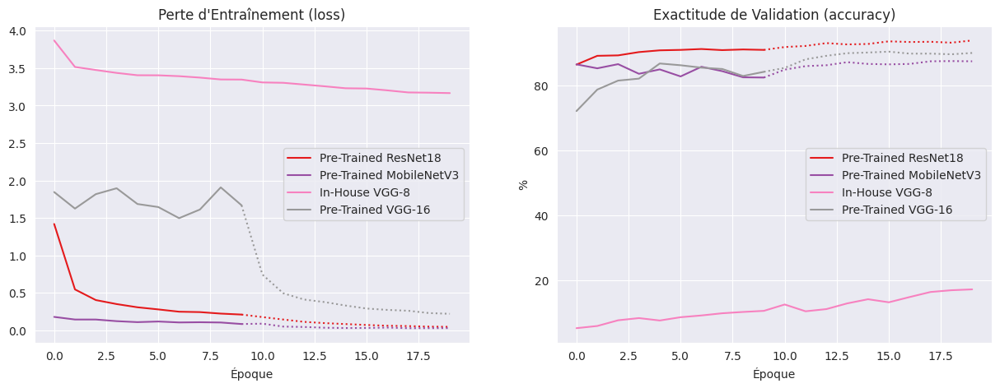

In [88]:
# with open('weights/training_results_B.pickle', 'rb') as handle:
#     training_results = pickle.load(handle)

plot_comparison(training_results)

Comme le montre ces graphiques, 20 époques ne suffisent pas à ce que le VGG-8 in-house converge. 

In [89]:
pd.DataFrame({
    "model": [
        "In-House VGG-8", 
        "Pre-Trained VGG-16", 
        "Pre-Trained ResNet18", 
        "Pre-Trained MobileNetV3"
    ],
    "params": [
        sum(p.numel() for p in model_2B1.parameters()),
        sum(p.numel() for p in model_2B2.parameters()),
        sum(p.numel() for p in model_2B3.parameters()),
        sum(p.numel() for p in model_2B4.parameters())
    ],
    "training loss": [
        training_results["2B1"]["train_loss"][-1],
        training_results["2B2"]["train_loss"][-1],
        training_results["2B3"]["train_loss"][-1],
        training_results["2B4"]["train_loss"][-1]
    ],
    "validation accuracy": [
        training_results["2B1"]["validation_accuracy"][-1],
        training_results["2B2"]["validation_accuracy"][-1],
        training_results["2B3"]["validation_accuracy"][-1],
        training_results["2B4"]["validation_accuracy"][-1]
    ]
})

,model,params,training loss,validation accuracy
0,In-House VGG-8,14031205,3.167366,17.185386
1,Pre-Trained VGG-16,134412133,1.669391,84.303112
2,Pre-Trained ResNet18,11195493,0.211104,91.069012
3,Pre-Trained MobileNetV3,1555781,0.084903,82.543978


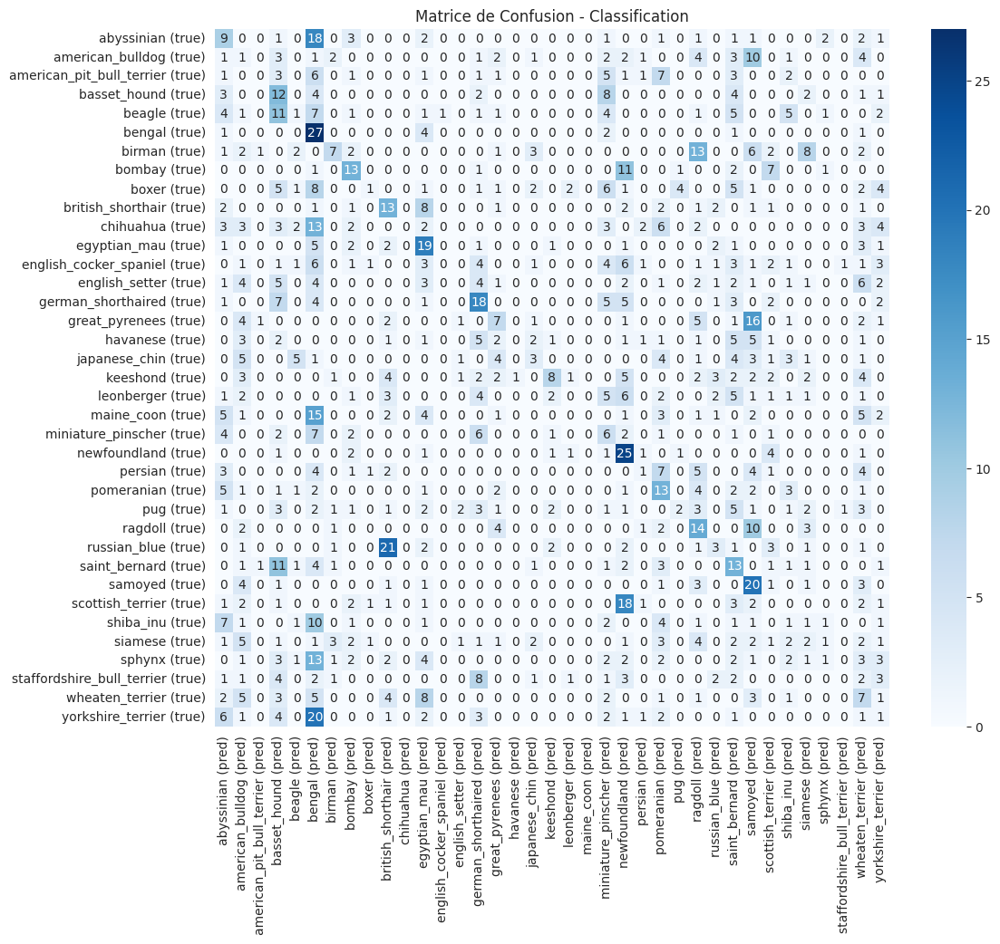

In [70]:
plot_classification_results(model_2B1, label_key="race_id")

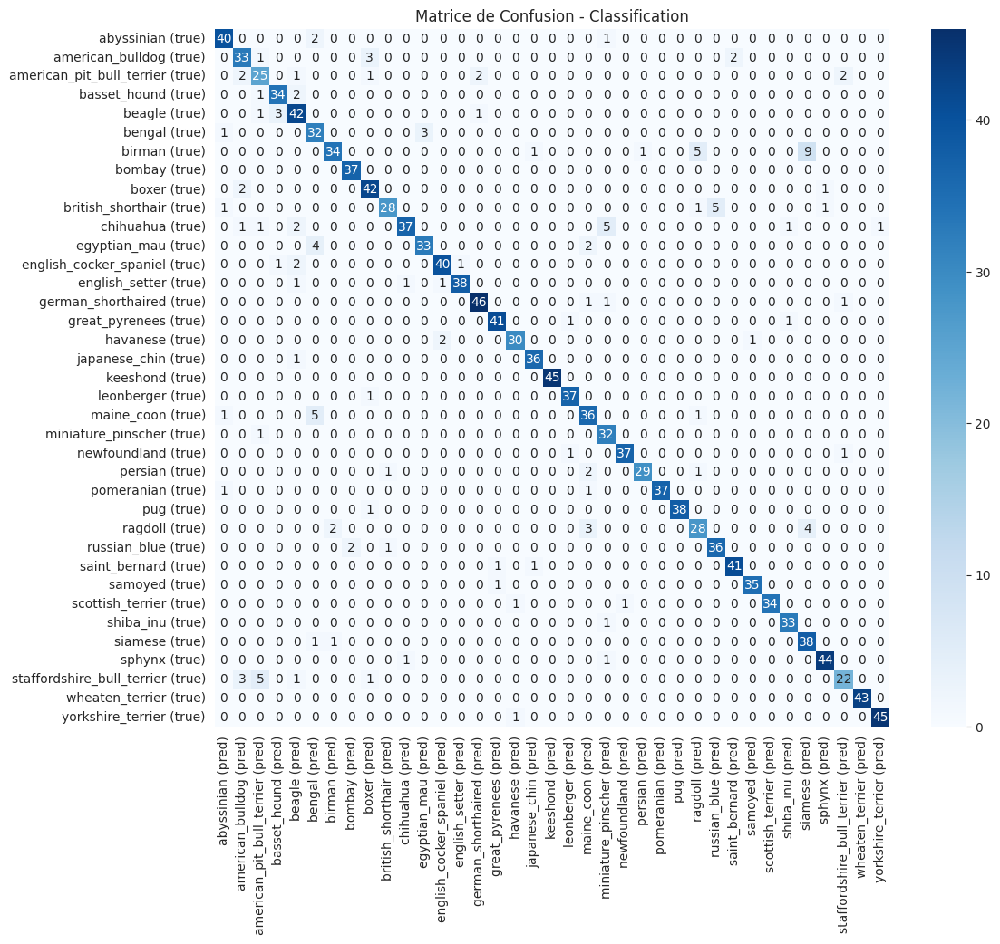

In [73]:
plot_classification_results(model_2B2, label_key="race_id")

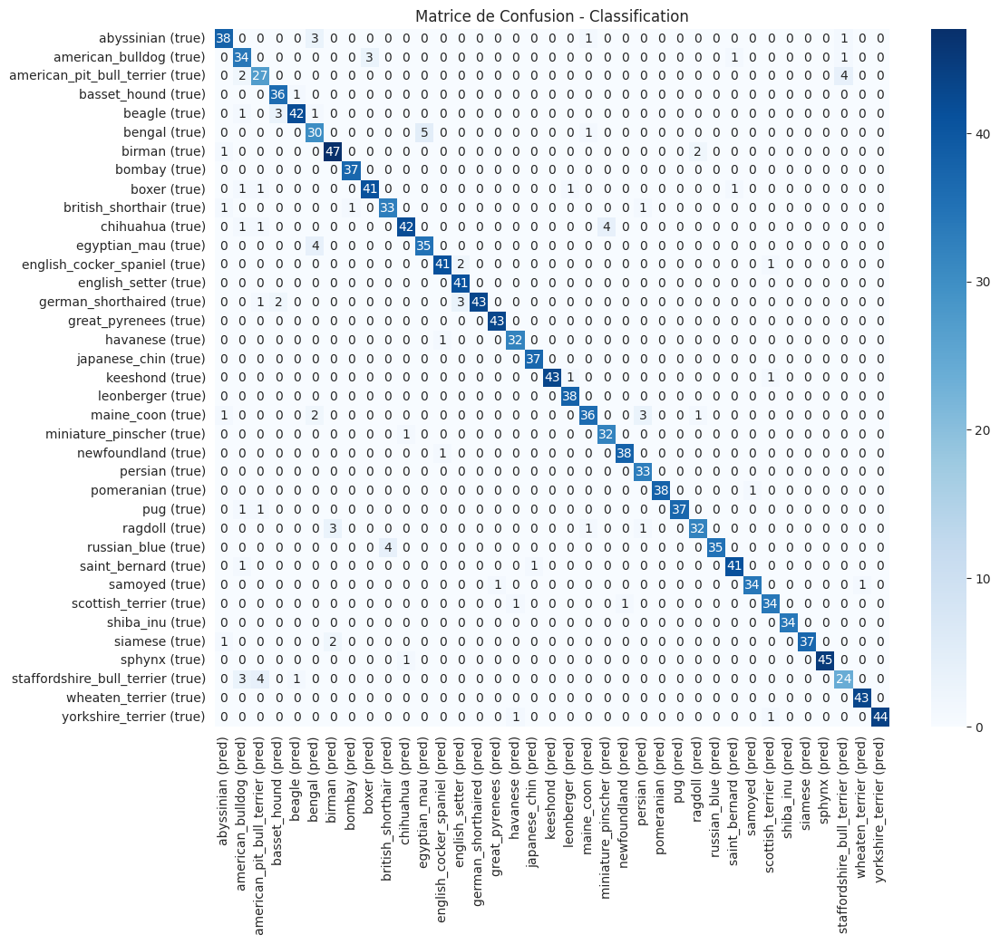

In [74]:
plot_classification_results(model_2B3, label_key="race_id")

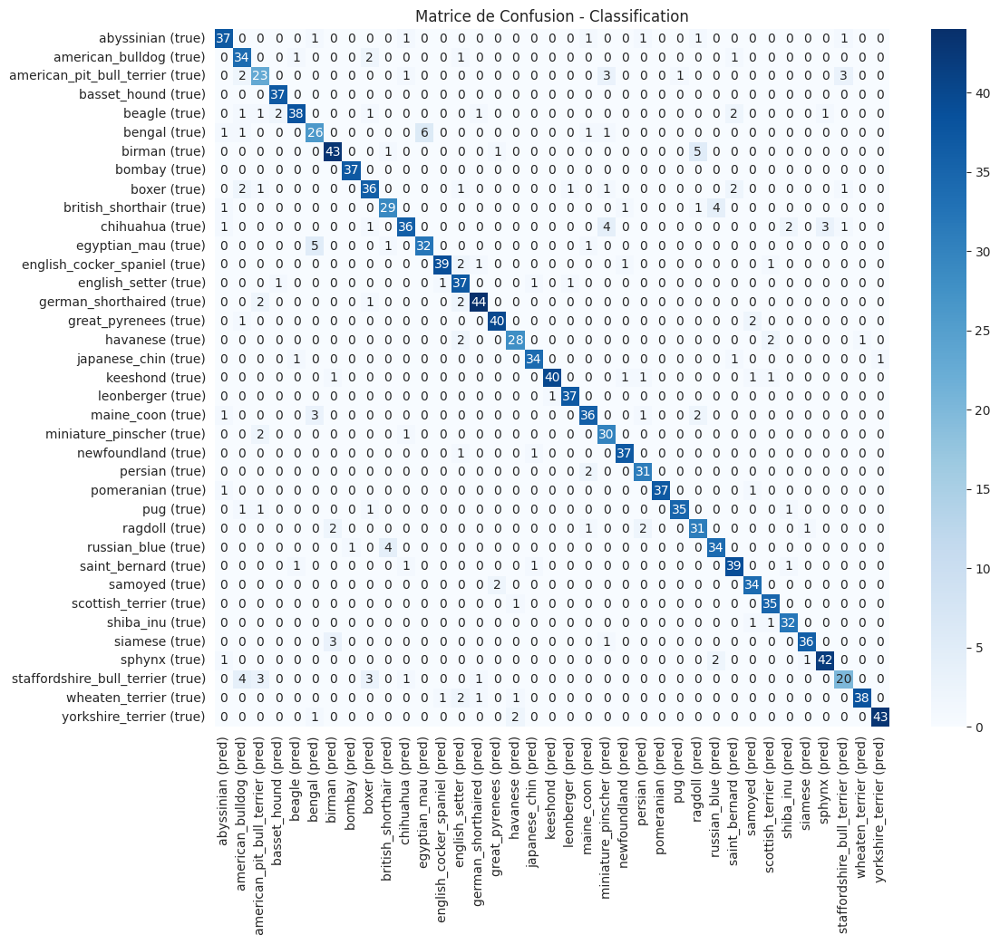

In [90]:
plot_classification_results(model_2B4, label_key="race_id")

Le passage d'une classification binaire (Chat vs Chien) à une classification fine en 37 races a considérablement augmenté la difficulté du problème. Les résultats obtenus permettent de tirer plusieurs enseignements clés :

1. Le modèle "In-House VGG-8" montre ici ses limites. Avec 37 classes et seulement ~200 images par classe, l'entrainement est lent et il peine à extraire des caractéristiques suffisamment discriminantes pour différencier des races visuellement proches (ex: American Bulldog vs Staffordshire Bull Terrier). 

2. Les modèles pré-entraînés (ResNet18, MobileNetV3) confirment leur robustesse. Même si l'accuracy globale est naturellement inférieure à celle de la tâche binaire, ces modèles parviennent à généraliser correctement.
Ils bénéficient de filtres de bas niveau (bords, textures de poils) déjà optimisés, cruciaux pour distinguer des races qui ne diffèrent parfois que par la texture du pelage ou la forme du museau.

3. La confusion inter-races La matrice de confusion révèle que les erreurs ne sont pas aléatoires mais sémantiques :
Confusion intra-espèce : Le modèle confond très rarement un chien avec un chat. Les erreurs se concentrent entre races de la même espèce.
Groupes visuels : On observe des "blocs" de confusion entre races physiquement similaires (ex: les différents types de Terriers, ou Abyssinian vs Bengal). Cela indique que le modèle a bien appris la morphologie globale mais échoue parfois sur les détails subtils.

## III. Segmentation

#### Préparation des données pour la segmentation.

En nous basant sur l'analyse exploratoire, nous allons :
- Utiliser un **RandomResizedCrop** pour normaliser les différences de zoom (biais de taille).
- Retirer les images avec des anomalies sur les masques de segmentation.

In [91]:
data_segment = OxfordPetsDataset(
    fetch_masks = True,
    joint_transform = augmentation_transform,
    dataset_root = "../data/oxford-pets",
    identifiers = identifiers
)

In [92]:
# can be set to None
_generator = torch.Generator().manual_seed(42)

# Split Train/Val (80% / 20%)
_train_size = int(0.8 * len(data_segment))
_val_size = len(data_segment) - _train_size

subset_segment_train, subset_segment_val = torch.utils.data.random_split(
    data_segment, [_train_size, _val_size], 
    generator = _generator
)

In [93]:
loader_segment_train = DataLoader(subset_segment_train, batch_size=32, shuffle=True)
loader_segment_val = DataLoader(subset_segment_val, batch_size=32, shuffle=False)

### III.A Segmentation des pets

In [94]:
def compute_iou(preds, masks, num_classes=3):
    # preds: (B, C, H, W), masks: (B, H, W)
    preds = torch.argmax(preds, dim=1)
    ious = []

    for cls in range(num_classes):
        intersection = ((preds == cls) & (masks == cls)).sum().float().item()
        union = ((preds == cls) | (masks == cls)).sum().float().item()

        if union == 0:
            ious.append(np.nan) # Pas de pixels de cette classe dans le batch
        else:
            ious.append(intersection / union)
    return ious

#### III.A.1 UNet simple

In [95]:
### UNet class (Ronneberger et al., 2015)

# in the original paper (Ronneberger et al., 2015) the UNet 
# has 4 convolution blocks and deals with 572*572 images
# In our case we might need less convolution blocks to avoid overfitting
# which is why the parameter conv_blocks exists
# The original paper also doesn't uses padding in the convolutions
# But it makes it harder to get the segmentation masks to the same size
# as the images.

class UNet(nn.Module):

    def __init__(self, conv_blocks=4, in_channels=3, out_channels=3):
        super(UNet, self).__init__()

        def ConvBlock(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )

        # Listes pour stocker les modules
        self.encoder_convs = nn.ModuleList()
        self.decoder_ups = nn.ModuleList()
        self.decoder_convs = nn.ModuleList()

        self.nb_blocks = conv_blocks

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encodeur
        in_c = in_channels
        out_c = 64
        for i in range(conv_blocks):
            self.encoder_convs.append(
                ConvBlock(in_c, out_c)
            )

            in_c = out_c
            out_c *= 2

        # Bottleneck
        self.bottleneck = ConvBlock(in_c, out_c)

        # Décodeur
        up_in = out_c
        up_out = out_c // 2
        for i in range(conv_blocks):

            self.decoder_ups.append(
                nn.ConvTranspose2d(up_in, up_out, kernel_size=2, stride=2)
            )

            # concatenate up_out + skip_connection_channels (qui est aussi up_out)
            self.decoder_convs.append(
                ConvBlock(up_in, up_out)
            )

            up_in = up_out
            up_out //= 2

        # Conv finale
        self.final_conv = nn.Conv2d(up_in, out_channels, kernel_size=1)

    def forward(self, x):
        skip_list = []

        # Encodeur
        for conv in self.encoder_convs:
            x = conv(x)
            skip_list.append(x)
            x = self.pool(x)

        # Bottleneck
        x = self.bottleneck(x)

        # Décodeur
        skip_list_reversed = skip_list[::-1] # Inverser pour le décodeur
        for i in range(self.nb_blocks):
            x = self.decoder_ups[i](x)
            skip_connection = skip_list_reversed[i]

            x = torch.cat((skip_connection, x), dim=1)
            x = self.decoder_convs[i](x)

        return self.final_conv(x)

In [96]:
model_UNet = UNet(conv_blocks=2)
model_summary(model_UNet, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [1, 3, 224, 224]          --
├─ModuleList: 1-3                        --                        (recursive)
│    └─Sequential: 2-1                   [1, 64, 224, 224]         --
│    │    └─Conv2d: 3-1                  [1, 64, 224, 224]         1,792
│    │    └─ReLU: 3-2                    [1, 64, 224, 224]         --
│    │    └─Conv2d: 3-3                  [1, 64, 224, 224]         36,928
│    │    └─ReLU: 3-4                    [1, 64, 224, 224]         --
├─MaxPool2d: 1-2                         [1, 64, 112, 112]         --
├─ModuleList: 1-3                        --                        (recursive)
│    └─Sequential: 2-2                   [1, 128, 112, 112]        --
│    │    └─Conv2d: 3-5                  [1, 128, 112, 112]        73,856
│    │    └─ReLU: 3-6                    [1, 128, 112, 112]        --
│    │    └─Conv2d: 3-7                  [1, 128, 112, 1

In [99]:
def train_model_segment(model, train_loader, val_loader, criterion, optimizer, epochs=10):

    history = {
        "train_loss": [], 
        "validation_iou_pet": [],
        "validation_iou_back": []
    }
    model.to(device)

    for epoch in range(epochs):

        # Phase d'entraînement
        model.train()
        running_loss = []
        pbar = tqdm(train_loader, desc=f"[train] epoch {epoch+1}/{epochs}")

        for batch in pbar:
            images = batch["image"].to(device)

            # On soustrait 1 pour passer de [1, 2, 3] à [0, 1, 2] (alignement avec CrossEntropy)
            masks = batch["mask"].to(device).long().squeeze(1) - 1 # .long().squeeze(1) ?

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            running_loss.append(loss.item())
            pbar.set_postfix({"mean loss": f"{mean(running_loss):.04f}"})

        # Phase de validation
        model.eval()
        validation_ious = []
        pbar2 = tqdm(val_loader, desc=f"[validation] on validation data")

        with torch.no_grad():
            for batch in pbar2:
                images = batch["image"].to(device)
                masks = (batch["mask"].to(device).long().squeeze(1)) - 1

                outputs = model(images)
                batch_ious = compute_iou(outputs, masks)
                validation_ious.append(batch_ious)

                pbar2.set_postfix({
                    "pet iou": f"{batch_ious[0]:.03f}",
                    "back iou": f"{batch_ious[1]:.03f}"
                })

        # Moyenne des IoU sur toutes les images (en ignorant les NaN)
        mean_ious = np.nanmean(np.array(validation_ious), axis=0)

        history["train_loss"].append(mean(running_loss))
        history["validation_iou_pet"].append(mean_ious[0]) # Classe 0 : Animal
        history["validation_iou_back"].append(mean_ious[1])  # Classe 1 : Fond

    print(f"training step completed.")
    return history

In [101]:
def _train_model_UNet():

    print()
    print(f"using device: {device}")
    model_UNet.to(device)

    training_results["UNet"] = train_model_segment(
        model_UNet, loader_segment_train, loader_segment_val, 
        criterion = torch.nn.CrossEntropyLoss(ignore_index=2),
        optimizer = torch.optim.Adam(model_UNet.parameters(), lr=0.001),
        epochs=20
    )


_train_model_UNet()
torch.save(model_UNet.state_dict(), 'weights/model_UNet.pth')
print("Model saved to weights/model_UNet.pth")


using device: cuda


[train] epoch 1/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 11/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 12/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 13/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 14/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 15/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 16/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 17/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 18/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 19/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 20/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_UNet.pth


#### III.A.2 Attention UNet.

In [102]:
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()

        # F_g: nombre de canaux du décodeur (gate)
        # F_l: nombre de canaux de la skip connection
        # F_int: nombre de canaux intermédiaires

        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, padding=0),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, padding=0),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, padding=0),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi # On filtre la skip connection par l'attention

In [103]:
class AttentionUNet(nn.Module):

    def __init__(self, conv_blocks=4, in_channels=3, out_channels=3):
        super(AttentionUNet, self).__init__()

        def ConvBlock(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )

        # Listes pour stocker les modules
        self.encoder_convs = nn.ModuleList()
        self.attention_gates = nn.ModuleList()
        self.decoder_ups = nn.ModuleList()
        self.decoder_convs = nn.ModuleList()

        self.nb_blocks = conv_blocks
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encodeur
        in_c = in_channels
        out_c = 64
        for i in range(conv_blocks):
            self.encoder_convs.append(
                ConvBlock(in_c, out_c)
            )

            in_c = out_c
            out_c *= 2

        # Bottleneck
        self.bottleneck = ConvBlock(in_c, out_c)

        # Décodeur
        up_in = out_c
        up_out = out_c // 2
        for i in range(conv_blocks):

            self.decoder_ups.append(
                nn.ConvTranspose2d(up_in, up_out, kernel_size=2, stride=2)
            )

            # Attention Gate: 
            # g (gate signal) vient du décodeur
            # x (skip) vient de l'encodeur
            # F_int est souvent la moitié de up_out askip
            self.attention_gates.append(
                AttentionGate(F_g=up_out, F_l=up_out, F_int=up_out // 2)
            )

            self.decoder_convs.append(
                ConvBlock(up_in, up_out)
            )

            up_in = up_out
            up_out //= 2

        # Conv finale
        self.final_conv = nn.Conv2d(up_in, out_channels, kernel_size=1)

    def forward(self, x):
        skip_list = []

        # Encodeur
        for conv in self.encoder_convs:
            x = conv(x)
            skip_list.append(x)
            x = self.pool(x)

        # Bottleneck
        x = self.bottleneck(x)

        # Décodeur
        skip_list_reversed = skip_list[::-1] # Inverser pour le décodeur
        for i in range(self.nb_blocks):
            g = self.decoder_ups[i](x)
            x_skipped = skip_list_reversed[i]
            x_attentioned = self.attention_gates[i](g, x_skipped)

            x = torch.cat((x_attentioned, g), dim=1)
            x = self.decoder_convs[i](x)

        return self.final_conv(x)

In [105]:
model_AUNet = AttentionUNet(conv_blocks=2)
model_summary(model_AUNet, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
AttentionUNet                            [1, 3, 224, 224]          --
├─ModuleList: 1-3                        --                        (recursive)
│    └─Sequential: 2-1                   [1, 64, 224, 224]         --
│    │    └─Conv2d: 3-1                  [1, 64, 224, 224]         1,792
│    │    └─ReLU: 3-2                    [1, 64, 224, 224]         --
│    │    └─Conv2d: 3-3                  [1, 64, 224, 224]         36,928
│    │    └─ReLU: 3-4                    [1, 64, 224, 224]         --
├─MaxPool2d: 1-2                         [1, 64, 112, 112]         --
├─ModuleList: 1-3                        --                        (recursive)
│    └─Sequential: 2-2                   [1, 128, 112, 112]        --
│    │    └─Conv2d: 3-5                  [1, 128, 112, 112]        73,856
│    │    └─ReLU: 3-6                    [1, 128, 112, 112]        --
│    │    └─Conv2d: 3-7                  [1, 128, 112, 1

In [107]:
def _train_model_AUNet():

    print()
    print(f"using device: {device}")
    model_AUNet.to(device)

    training_results["AUNet"] = train_model_segment(
        model_AUNet, loader_segment_train, loader_segment_val, 
        criterion = torch.nn.CrossEntropyLoss(ignore_index=2),
        optimizer = torch.optim.Adam(model_AUNet.parameters(), lr=0.001),
        epochs=20
    )


_train_model_AUNet()
torch.save(model_AUNet.state_dict(), 'weights/model_AUNet.pth')
print("Model saved to weights/model_AUNet.pth")


using device: cuda


[train] epoch 1/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 2/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 3/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 4/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 5/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 6/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 7/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 8/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 9/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 10/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 11/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 12/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 13/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 14/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 15/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 16/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 17/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 18/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 19/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

[train] epoch 20/20:   0%|          | 0/185 [00:00<?, ?it/s]

[validation] on validation data:   0%|          | 0/47 [00:00<?, ?it/s]

training step completed.
Model saved to weights/model_AUNet.pth


Les IoU ne bougent pas bien, les modèles n'ont pas réussis à être entraînés.